Useful import statements

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Updating tensorflow to 2.0 (Temp)

In [0]:
'''
!pip install  tf-nightly-2.0-preview
!pip install IPython
'''

Using tensorboard

In [0]:
from time import time
import datetime, os
import tensorflow as tf
from tensorboard import notebook
import tensorboard
%load_ext tensorboard

import tensorflow as tf
print(tf.__version__)

Creating a tensorboard instance:

In [0]:
print('{}:{}:{}_{}/{}/{}'.format(                     
                        datetime.datetime.now().strftime("%H"),
                        datetime.datetime.now().strftime("%M"),
                        datetime.datetime.now().strftime("%S"),
                        ###
                        datetime.datetime.now().strftime("%m"),
                        datetime.datetime.now().strftime("%d"),
                        datetime.datetime.now().strftime("%Y")
                        ))

In [0]:
"""
Calling tensorboard, place before .compile() to see live training
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}
"""

"""
Place right after .compile()
logdir = os.path.join(logs_base_dir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

in model.fit() set: callbacks = [tensorboard_callback]
"""

"""
Customizing: 

from tensorboard import notebook
notebook.list() # View open TensorBoard instances


# Control TensorBoard display. If no port is provided, 
# the most recently launched TensorBoard is used
notebook.display(port=6006, height=1000) 
"""

'\nCustomizing: \n\nfrom tensorboard import notebook\nnotebook.list() # View open TensorBoard instances\n\n\n# Control TensorBoard display. If no port is provided, \n# the most recently launched TensorBoard is used\nnotebook.display(port=6006, height=1000) \n'

#Deep Learning Book

##Chapters 1-2

###Defining the model using the sequential class

In [0]:
import tensorflow.keras 
from tensorflow.keras import models,layers,optimizers


model = models.Sequential()                                                     #creating a model with sequential class, a stack of linear layers.

model.add(
    layers.Dense(32, activation = 'relu', input_shape=(784,) )                  #creating a dense layer in the sequential model.
)              
model.add(
    layers.Dense(10, activation = 'softmax')
)

                                                                                #Defining the loss function and optimizer is the same for both model definitions.



model.compile( 
   optimizer = optimizers.RMSprop(lr = 0.001),                                   #creating the optimizer with a learning rate of 0.001.
   loss = 'mse',                                                                #Determine the loss function as mean squared error.
   metrics = ['accuracy']                                                       #Mean square error is measured by how accurate the model is.
)


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [0]:
import keras
from keras import layers
from keras.layers import Dense, Activation
from keras.models import Sequential

model = keras.models.Sequential()

#https://keras.io/getting-started/sequential-model-guide/

Using TensorFlow backend.


###Defining the model with the functional api

In [0]:
input_tensor = layers.Input(shape = (784,))
x = layers.Dense(32, activation = 'relu')(input_tensor)
output_tensor = layers.Dense(10, activation = 'softmax')(x)

model = models.Model(inputs = input_tensor, outputs = output_tensor)


AttributeError: ignored

###Naive functions

ReLU

In [0]:
import numpy as np

p = np.array([
    [1,2,3],
    [1,2,3],
    [1,2,3]
])

def naive_relu(x):

  assert len(x.shape) == 2                                                      #Assures that the tensor is of rank 2.
  
  x = x.copy()                                                                  #Copies the tensor x to avoid overwriting the tensor.
  for i in range(x.shape[0]):                                                   #Double loops evaluate each index and apply the activation function.
    for j in range(x.shape[1]):
      x[i,j] = max(x[i,j], 0)

  return x
naive_relu(p)

array([[1, 2, 3],
       [1, 2, 3],
       [1, 2, 3]])

Rank 2 Tensor Dot

In [0]:
import numpy as np

x1 = np.array([1,2,3,4,5])
y1 = np.array([1,2,3,4,5])


def naivevectordot(x,y):
  assert len(x.shape) == 1, "Check the shape of the vector"
  assert len(y.shape) == 1, "Check the shape of the vector"
  assert x.shape[0] == y.shape[0], "Check the shape of the vector"
  
  z = 0                                                                         #Make sure to initialize the variable
  
  for i in range(x.shape[0]):
    z += x[i] * y[i]
  
  return z

naivevectordot(x1,y1)

#Tensor Dot Product: https://people.rit.edu/pnveme/personal/EMEM851n/constitutive/tensors_rect.html



55

Matrix Vector dot product

In [0]:
import numpy as np

def matrix_vector_dot(x,y):
  assert len(x.shape) == 2
  assert len(y.shape) == 1
  assert x.shape[1] == y.shape[0]
  
  z = np.zeros(x.shape[0])
  
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      z += x[i,j] * y[i]
  return z

matrix = np.array([[1,2,3],[1,2,3]])
vector = np.array([1,2,3])

matrix_vector_dot(matrix,vector)

#implementation using naive vector dot:


  

array([18., 18.])

Matrix Matrix dot product

In [0]:
import numpy as np

def naivevectordot(x,y):
  assert len(x.shape) == 1, "Check the shape of the vector"
  assert len(y.shape) == 1, "Check the shape of the vector"
  assert x.shape[0] == y.shape[0], "Check the shape of the vector"
  
  z = 0                                                                         #Make sure to initialize the variable
  
  for i in range(x.shape[0]):
    z += x[i] * y[i]
  
  return z

def matrix_matrix_dot(x,y):
  assert len(x.shape) == 2
  assert len(y.shape) == 2
  assert x.shape[1] == y.shape[0]
  
  z = np.zeros(x.shape[0], y.shape[1])
  
  for i in range(x.shape[0]):
    for j in range(y.shape[1]):
      rows_x = x[i,:]
      columns_y = y[:,j]
      
      z =[i,j] = naivevectordot(row_x, column_y)
  return z


  

##Chapters 3 (Classifiers)

###Binary Classification with the IMDB Dataset

The IMDB dataset is a collection of 25,000 positive and negative reviews. The features a collection of reviews with words encoded as numbers. The model will find the correlation between positive and negative reviews based on the content of the feature.

Here the data is loaded and defined. The data is also vectorized into 1s and 0s to ensure that the model accepts the data types.

In [0]:
import tensorflow as tf
from tensorflow.keras import models, layers,optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.datasets import imdb


(train_data, train_labels), (test_data, test_labels) = imdb.load_data(          #Labels are kept as 1s and 0s for binary classfication of positive and negative reviews.
    num_words=10000)                                                            #Parameter num_words takes the 10,000 most frequent words in the dataset.


import numpy as np

def vectorize(sequences, dim = 10000):                                          #One hot encoding data into vectors of 1s and 0s
  results = np.zeros( (len(sequences),dim) )
  
  for i , sequences in enumerate(sequences):
    results[i, sequences] = 1
  return results

x_train = vectorize(train_data)
x_test = vectorize(test_data)



print(x_train)
print(train_data)




17465344/17464789 [==============================] - 0s 0us/step
[[0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 ...
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]]
[list([1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 5952, 15, 256, 4, 2, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 2, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 1

In [0]:
print("hello hello hello  \n h")

hello hello hello  
 h


Since the training and testing data were both tensors before, they needed to be vectorized into 1s and 0s. The label data is already in the form of 1s and 0s except they were listed as an array. Calling np.asarray removes the need of vectorizing data.

In [0]:
y_train = np.asarray(train_labels).astype(np.float32) 
y_test = np.asarray(test_labels).astype(np.float32) 

In [0]:
model_imdb = models.Sequential()
model_imdb.add(Dense(16,
               activation = 'relu',
               input_shape = (10000,)
               ))
model_imdb.add(Dense(16, activation = 'relu'))
model_imdb.add(Dense(1, activation = 'sigmoid'))

model_imdb.compile(optimizer = 'rmsprop',
                  loss = 'binary_crossentropy',
                  metrics = ['acc'])


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


**In order to avoid overfitting the data, the training data is separated into two sets to ensure accuracy of the model.**

In [0]:
x_values = x_train[10000:]
x_validation = x_train[:10000]

y_values = y_train[10000:]
y_validation = y_train[:10000]

model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )
 

Train on 15000 samples, validate on 10000 samples
Epoch 1/20
15000/15000 [==============================] - 2s 135us/sample - loss: 0.5094 - acc: 0.7959 - val_loss: 0.3937 - val_acc: 0.8609
Epoch 2/20
15000/15000 [==============================] - 1s 83us/sample - loss: 0.3078 - acc: 0.9029 - val_loss: 0.3196 - val_acc: 0.8773
Epoch 3/20
15000/15000 [==============================] - 1s 83us/sample - loss: 0.2290 - acc: 0.9252 - val_loss: 0.2787 - val_acc: 0.8924
Epoch 4/20
15000/15000 [==============================] - 1s 84us/sample - loss: 0.1825 - acc: 0.9416 - val_loss: 0.2771 - val_acc: 0.8889
Epoch 5/20
15000/15000 [==============================] - 1s 84us/sample - loss: 0.1472 - acc: 0.9525 - val_loss: 0.2877 - val_acc: 0.8860
Epoch 6/20
15000/15000 [==============================] - 1s 84us/sample - loss: 0.1245 - acc: 0.9613 - val_loss: 0.2880 - val_acc: 0.8869
Epoch 7/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.1049 - acc: 0.9680 - val_loss: 0

Data can be pulled from the training process using the history object:



```
model_history = model.fit(...)

history_dict = model_history.history
history_dict.keys()
```

After calling the keys() object, there should be 4 separate arrays listing the percentages of loss and accuracy of the model. This can be used to create a visualization.



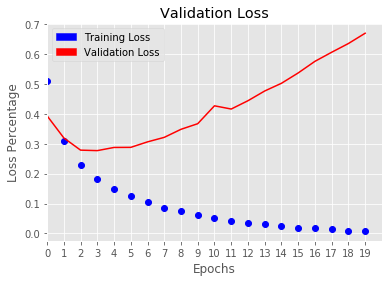

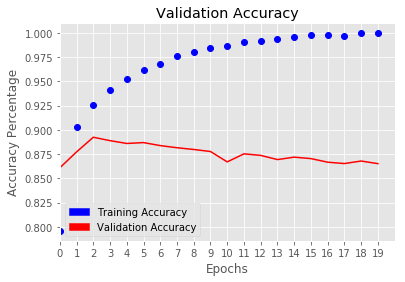

In [0]:
import matplotlib.pyplot as plt

history_data = model_imdb.history.history
history_data.keys()

loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

training_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"),plt.title("Training Loss"), plt.plot(epochs, loss_train, 'bo')

validation_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"),plt.title("Validation Loss"), plt.plot(epochs, loss_validation,'r')



import matplotlib.patches as mpatches

red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_loss_plot,validation_loss_plot)



acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 20)

training_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Training Accuracy"), plt.plot(epochs, acc_train, 'bo')

validation_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Validation Accuracy"), plt.plot(epochs, acc_validation,'r')

red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


plt.show(training_acc_plot,validation_acc_plot)

In [0]:
train_results = model_imdb.evaluate(x_test, y_test)


25000/25000 [==============================] - 2s 94us/sample - loss: 0.7386 - acc: 0.8506


After evaluating the data and interpreting the graphs, the model has a rough accuracy of 85%. Clearly the data is being overfitted since the validation plot is not the same as the training accuracy. At about 4 epochs, the model is at its peak optimzation.

A naive implementation can be created to obtain the peak solution at 4 epochs, however other techniques such as regularization can help prevent low variance of the model.

In [0]:
model_imdb.predict(x_test)

array([[0.00590655],
       [0.99999934],
       [0.9019731 ],
       ...,
       [0.00241759],
       [0.01536268],
       [0.61219287]], dtype=float32)

Here the .predict object tests the accuracy of the data. This data is returned as an array of how confident the model was for each array of numbers.



Overall, the binary classifier was somewhat successful. Stacks of ReLU activation layers can be used to filter data and is the most common activation function.

###Multi-classification Problem with Reuters dataset

Here the reuters dataset has a final output layer of 46 nodes.

In [0]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense

import matplotlib.pyplot as plt

from keras.datasets import reuters                                                             #Data is processed where each number corresponds to a word in a dictionary.
(train_data, train_labels), (test_data, test_labels) = reuters.load_data(num_words=10000)      #num_words cuts the number of words down to the 10,000 most frequently reoccuring words.


from tensorflow.python.keras.callbacks import TensorBoard


'''
print(train_data.shape)
print(train_labels.shape)
print(test_data.shape)
'''

import numpy as np

#Naive vectorization process

def vectorize_features(sequences,dim = 10000):
  results = np.zeros((len(sequences),dim) )
  for i, sequences in enumerate(sequences):
    results[i,sequences] = 1
  return results

def vectorize_labels(sequences, dim = 46):
  results = np.zeros((len(sequences),dim))
  for i, n in enumerate(sequences):
    results[i,n] = 1
  return results

x_train = vectorize_features(train_data)
x_test = vectorize_features(test_data)

y_train = vectorize_labels(train_labels)
y_test = vectorize_labels(test_labels)

x_train = x_train[5928:]
x_validation = x_train[:2964]

y_train = y_train[5928:]
y_validation = y_train[:2964]


#Declaring the model and the layers
model_reuters = models.Sequential()
model_reuters.add(Dense(128, activation = tf.nn.relu, input_shape = (10000,)))
model_reuters.add(Dense(128, activation = tf.nn.relu))
model_reuters.add(Dense(46, activation = tf.nn.softmax))

###
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
###

model_reuters.compile(optimizer = 'rmsprop', 
                      loss = 'categorical_crossentropy',
                      metrics = ['acc'])

###
logdir = os.path.join(logs_base_dir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
%tensorboard --logdir {logs_base_dir}
###

epoch_size = int(input("Enter Epochs:"))

model_reuters.fit(x_train,
                  y_train,
                 epochs = epoch_size,
                 batch_size = 512,
                 validation_data = (x_validation,y_validation),
                 callbacks = [tensorboard_callback])

model_history = model_reuters.history.history


#Opening TensorBoard


notebook.display(port = 6006)
#!tensorboard --logdir=logs/

2113536/2110848 [==============================] - 0s 0us/step


ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 511.

invalid info file: '/tmp/.tensorboard-info/pid-511.info'
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 316, in get_all
    raise
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 155, in _info_from_string
    if missing_keys:
ValueError: incompatible version: {'cache_key': 'eyJhcmd1bWVudHMiOlsiLS1sb2dkaXIiLCIuL2xvZ3MiXSwiY29uZmlndXJlX2t3YXJncyI6e30sIndvcmtpbmdfZGlyZWN0b3J5IjoiL2NvbnRlbnQifQ==', 'db': '', 'logdir': './logs', 'path_prefix': '', 'pid': 511, 'port': 6006, 'start_time': 1569504536, 'version': '2.1.0a20190926'}
invalid info file: '/tmp/.tensorboard-info/pid-511.info'
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 316, in get_all
    raise
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 155, in _info_from_string
    if missing_keys:
ValueError: incompatible version: {'cache_key': 'eyJhcmd1bWV

Enter Epochs:20
Train on 3054 samples, validate on 2964 samples
Epoch 1/20
3054/3054 [==============================] - 1s 359us/sample - loss: 2.9068 - acc: 0.4407 - val_loss: 1.8335 - val_acc: 0.5462
Epoch 2/20
3054/3054 [==============================] - 1s 263us/sample - loss: 1.5968 - acc: 0.6490 - val_loss: 1.1822 - val_acc: 0.7520
Epoch 3/20
3054/3054 [==============================] - 1s 257us/sample - loss: 1.1101 - acc: 0.7659 - val_loss: 0.8878 - val_acc: 0.8185
Epoch 4/20
3054/3054 [==============================] - 1s 262us/sample - loss: 0.8468 - acc: 0.8229 - val_loss: 0.6623 - val_acc: 0.8728
Epoch 5/20
3054/3054 [==============================] - 1s 260us/sample - loss: 0.6463 - acc: 0.8762 - val_loss: 0.5382 - val_acc: 0.8964
Epoch 6/20
3054/3054 [==============================] - 1s 265us/sample - loss: 0.5028 - acc: 0.9086 - val_loss: 0.3941 - val_acc: 0.9329
Epoch 7/20
3054/3054 [==============================] - 1s 269us/sample - loss: 0.3994 - acc: 0.9332 - val_l

invalid info file: '/tmp/.tensorboard-info/pid-511.info'
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 316, in get_all
    raise
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/manager.py", line 155, in _info_from_string
    if missing_keys:
ValueError: incompatible version: {'cache_key': 'eyJhcmd1bWVudHMiOlsiLS1sb2dkaXIiLCIuL2xvZ3MiXSwiY29uZmlndXJlX2t3YXJncyI6e30sIndvcmtpbmdfZGlyZWN0b3J5IjoiL2NvbnRlbnQifQ==', 'db': '', 'logdir': './logs', 'path_prefix': '', 'pid': 511, 'port': 6006, 'start_time': 1569504536, 'version': '2.1.0a20190926'}


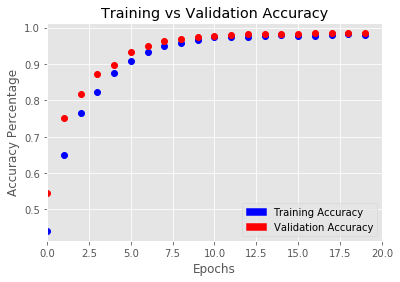

In [0]:
model_history = model_reuters.history.history

train_accuracy = model_history['acc']
validation_accuracy = model_history['val_acc']

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

epochs = [i for i in range(0,epoch_size)]

train_accuracy_plot = plt.plot(epochs, train_accuracy,'bo'),plt.xlim(0,epoch_size),plt.style.use('ggplot'), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Training vs Validation Accuracy")
validation_accuracy_plot = plt.plot(epochs, validation_accuracy,'ro'),plt.xlim(0,epoch_size),plt.style.use('ggplot'), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Training vs Validation Accuracy")


red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


from pylab import rcParams
rcParams['figure.figsize'] = 20,10 

plt.savefig('Accuracy_Plot.png')

plt.show(train_accuracy_plot,validation_accuracy_plot)

In [0]:
model_reuters.evaluate(x_test,y_test)

2246/2246 [==============================] - 0s 135us/sample - loss: 1.2858 - acc: 0.7636


[1.2857954765363984, 0.7635797]

###Linear classification with Boston Housing dataset

In [0]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import models, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from tensorflow.keras.datasets import boston_housing

(train_data, train_labels), (test_data, test_labels) = boston_housing.load_data()

print(train_data.shape)
print(test_data.shape)

print(train_labels.shape)
print(test_labels.shape)



57344/57026 [==============================] - 0s 0us/step
(404, 13)
(102, 13)
(404,)
(102,)


##Chapter 4 (Machine Learning Principles)

###How neural networks function

Neural networks function by using biases, weights, activations, nodes, and loss functions to extract data and patterns from a dataset.

Below is a simple neural network with only 2 hidden layers. In a production scale model, there would be thousands of nodes in a hidden layer.

![alt text](https://miro.medium.com/max/2636/1*Gh5PS4R_A5drl5ebd_gNrg@2x.png)



*   Input layer:


```
each node in the input layer takes tensors as an input and feeds it directly into the connected hidden                            layers.
```

Each node can further be visualized as this:





![alt text](https://www.researchgate.net/profile/Pradeep_Singh22/publication/283339701/figure/fig2/AS:421642309509122@1477538768781/Single-Layer-Perceptron-Network-Multilayer-Perceptron-Network-These-type-of-feed-forward.png)

Here the inputs are connected to **weights** and those are connected to a summation which connects this to an **activation** node.



*   Weights: 


```
Weights control the amount of power an input has by multiplying the each value in the input tensor by a scalar. This is applied to all of the weights and inputs and then the sum of the product of all inputs and weights is then fed into an activation function.
```


*   Activation Functions:



```
Activation functions apply a non-linearity to extract data from an input. This is useful because it allows a tensor to be transformed and receive new data that could not be seen from a linear transformation.
```

This is repeated several times until it reaches a **Loss Function**.



![alt text](https://www.oreilly.com/library/view/machine-learning-with/9781785889936/assets/image_07_002.jpg)

A loss function takes a value and compares it to the predicted value. This is summed with all of the inputs and then divided by the average. The goal is to decrease this average by adjusting each of the weights. The amount to change the weights by is determined by backpropagation in which the model goes backwards to adjust all of the weights.

![alt text](https://blog.algorithmia.com/wp-content/uploads/2018/04/word-image-4.png)

![alt text](https://thumbs.gfycat.com/SmallThoughtfulAmericankestrel-size_restricted.gif)

The gradient of the loss function is found by taking the derivative of the loss function with respect to all of the weights in a model. Above is an animation showing how a simple neural network finds it's derivative. After finding the derivative, it is multiplied by a hyperparameter called the **learning rate** the is subtracted from all of the weight values. Eventually, the model will converge to a minima in which it has reached the minimum loss for a dataset.

###Methods of determining validation data

The most simple version of determining a validation set/test set is to "hold out" a portion of the dataset. Then create a larger training partition (Source: Google Machine Learning Crash Course)

![alt text](https://developers.google.com/machine-learning/crash-course/images/PartitionThreeSets.svg)

In [0]:
import numpy as np 

data = np.array([i for i in range(1 ,21)])

train_data = data[0:9]
validation_data = data[10:15]                                                   #Partioning data
test_data = data[15:20]

print(
train_data,
validation_data ,
test_data
)


[1 2 3 4 5 6 7 8 9] [11 12 13 14 15] [16 17 18 19 20]


K-Fold validation is a type of partitioning that takes the dataset and splits it up into K partitions. One partition will be the validation data and the rest of the dataset (K-1) will be trained on the model and then the model will be evaluated on the validation data. This is repeated several times until each partition has it's turn to be the validation data.

![alt text](https://miro.medium.com/max/3018/1*IjKy-Zc9zVOHFzMw2GXaQw.png)

In [0]:
import numpy as np

class naive_k_fold():
  def __init__(self,data,k):
    self.data = data
    self.k = k

  def k_fold(data, k):
    
    k = k
    num_validation_samples = len(data)//k
    np.random.shuffle(data)

    for i in range(k):
      validation_data = data[num_validation_samples * i : num_validation_samples * (i +1)] 
      training_data = data[:num_validation_samples * i] + data[num_validation_samples * (i+1):]   #Concanting a list.
      
      
      #Collecting a list of averages from cross validation.
      '''
      model = get_model()
      model.train(training_data)
      validation_score = model.evaluate(validation_data)
      validation_scores.append(validation_score)
      validation_score = nnp.average(validaiton_scores)
      
      '''


  

This K-fold validation can be carried over to what is called "Iterated K-Fold Validation", in which the k-fold validation process is iterated several times.

**Feature Engineering**


Typically, data should be organized to prevent the model from creating patterns that are not wanted. Here are some general practices for processing data

*   Vectorization: Encoding data into tensors with datatype float.
*   Value Normalzation: Data should be normalized within a certain range. Stricter normalization such as having each feature have a mean of 0 and an STD of 1.
*   Missing Values: If the training data is missing values, it can be replaced with zeros if the data is not significant. If the data is significant, generate some "fake" values and replace the holes.




###Overfitting/Underfitting

Overfitting occurs when a model does not generalize when despite having a high accuracy on training data. Below are methods of combating overfitting.

###Decreasing model size

The simplest way to reduce overfitting is to **decrease the size of the model** and increase the amount of data present. 

The memorization capacity is proportional to the size of the model. More layers and learnable parameters results in the ability for the model to memorize all of it's inputs. Reducing the model size forces the model to improve it's generalization since it can't memorize an entire dataset.


###Preprocessing data

In [0]:
import tensorflow as tf
from tensorflow.keras import models, layers,optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.datasets import imdb


(train_data, train_labels), (test_data, test_labels) = imdb.load_data(          #Labels are kept as 1s and 0s for binary classfication of positive and negative reviews.
    num_words=10000)                                                            #Parameter num_words takes the 10,000 most frequent words in the dataset.


import numpy as np

def vectorize(sequences, dim = 10000):                                          #One hot encoding data into vectors of 1s and 0s
  results = np.zeros( (len(sequences),dim) )
  
  for i , sequences in enumerate(sequences):
    results[i, sequences] = 1
  return results

x_train = vectorize(train_data)
x_test = vectorize(test_data)

y_train = np.asarray(train_labels).astype(np.float32) 
y_test = np.asarray(test_labels).astype(np.float32) 

x_values = x_train[10000:]
x_validation = x_train[:10000]

y_values = y_train[10000:]
y_validation = y_train[:10000]

NameError: ignored

###Running the models

In [0]:
model_imdb = models.Sequential()
model_imdb.add(Dense(16,
               activation = 'relu',
               input_shape = (10000,)
               ))
model_imdb.add(Dense(16, activation = 'relu'))
model_imdb.add(Dense(1, activation = 'sigmoid'))

model_imdb.compile(optimizer = 'rmsprop',
                  loss = 'binary_crossentropy',
                  metrics = ['acc'])

model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )

################################################################################
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

history_data = model_imdb.history.history
history_data.keys()

loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

################################################################################
training_loss_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20), 
plt.grid(True), 
plt.xlabel("Epochs"), 
plt.ylabel("Loss Percentage"),
plt.title("Training Loss"), 
plt.plot(epochs, loss_train, 'bo')

################################################################################
validation_loss_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20), 
plt.grid(True), 
plt.xlabel("Epochs"), 
plt.ylabel("Loss Percentage"),
plt.title("Validation Loss"), 
plt.plot(epochs, loss_validation,'r')

################################################################################
red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_loss_plot,validation_loss_plot)

################################################################################
acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 10)

################################################################################
training_acc_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20), 
plt.grid(True), 
plt.xlabel("Epochs"), 
plt.ylabel("Accuracy Percentage"),
plt.title("Training Accuracy"), 
plt.plot(epochs, acc_train, 'bo')

################################################################################
validation_acc_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20), 
plt.grid(True), 
plt.xlabel("Epochs"), 
plt.ylabel("Accuracy Percentage"),
plt.title("Validation Accuracy"), 
plt.plot(epochs, acc_validation,'r')

################################################################################
red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


plt.show(training_acc_plot,validation_acc_plot)

Train on 15000 samples, validate on 10000 samples
Epoch 1/20
15000/15000 [==============================] - 1s 94us/sample - loss: 0.6107 - acc: 0.7802 - val_loss: 0.5444 - val_acc: 0.8436
Epoch 2/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.4882 - acc: 0.8721 - val_loss: 0.4591 - val_acc: 0.8597
Epoch 3/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.4032 - acc: 0.8914 - val_loss: 0.3962 - val_acc: 0.8724
Epoch 4/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.3399 - acc: 0.9035 - val_loss: 0.3551 - val_acc: 0.8768
Epoch 5/20
15000/15000 [==============================] - 1s 83us/sample - loss: 0.2915 - acc: 0.9154 - val_loss: 0.3224 - val_acc: 0.8835
Epoch 6/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.2549 - acc: 0.9234 - val_loss: 0.3019 - val_acc: 0.8875
Epoch 7/20
15000/15000 [==============================] - 1s 82us/sample - loss: 0.2256 - acc: 0.9311 - val_loss: 0.

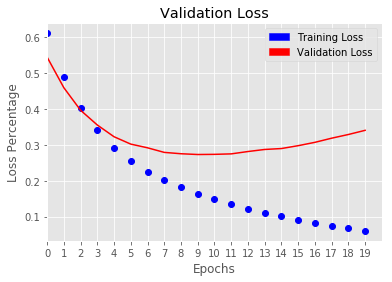

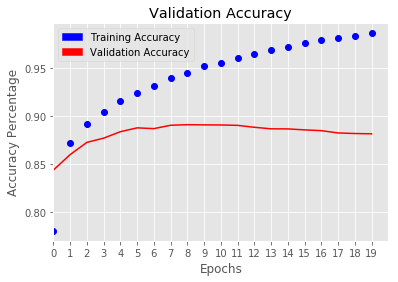

In [0]:
model_imdb = models.Sequential()
model_imdb.add(Dense(4,
               activation = 'relu',
               input_shape = (10000,)
               ))
model_imdb.add(Dense(4, activation = 'relu'))
model_imdb.add(Dense(1, activation = 'sigmoid'))

model_imdb.compile(optimizer = 'rmsprop',
                  loss = 'binary_crossentropy',
                  metrics = ['acc'])

model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )

################################################################################
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
history_data = model_imdb.history.history
#history_data.keys()

################################################################################
loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

training_loss_plot = plt.style.use('ggplot'),
                     plt.xticks(range(0,20)),
                     plt.xlim(0,20), 
                     plt.grid(True), 
                     plt.xlabel("Epochs"),
                     plt.ylabel("Loss Percentage"),
                     plt.title("Training Loss"), 
                     plt.plot(epochs, loss_train, 'bo')

################################################################################
validation_loss_plot = plt.style.use('ggplot'),
                       plt.xticks(range(0,20)),
                       plt.xlim(0,20),
                       plt.grid(True), 
                       plt.xlabel("Epochs"), 
                       plt.ylabel("Loss Percentage"),
                       plt.title("Validation Loss"), 
                       plt.plot(epochs, loss_validation,'r')
              
################################################################################
red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plot1 = plt.show(training_loss_plot,validation_loss_plot)

################################################################################
acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 20)

################################################################################
training_acc_plot = plt.style.use('ggplot'),
                    plt.xticks(range(0,20)),plt.xlim(0,20), 
                    plt.grid(True), plt.xlabel("Epochs"), 
                    plt.ylabel("Accuracy Percentage"),
                    plt.title("Training Accuracy"), 
                    plt.plot(epochs, acc_train, 'bo')

################################################################################
validation_acc_plot = plt.style.use('ggplot'),
                      plt.xticks(range(0,20)),
                      plt.xlim(0,20), plt.grid(True),
                      plt.xlabel("Epochs"), 
                      plt.ylabel("Accuracy Percentage"),
                      plt.title("Validation Accuracy"), 
                      plt.plot(epochs, acc_validation,'r')

################################################################################
red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


plot2 = notline = plt.show(training_acc_plot,validation_acc_plot)

Comparing these two graphs, restricting the capacity of the model shows an increase in generalization power.

###Regularization

![alt text](https://i2.wp.com/laid.delanover.com/wp-content/uploads/2018/01/reg_formulas.png)

Another way to combat overfitting is to use regularization. Regularization involves penalizing weight values by constraining the size of the weights. L1 regularization takes the absolute value and L2 takes the weight value squares. Both methods add the sum to the loss function to decrease noisy convergence.

####Preprocessing data

In [0]:
import tensorflow as tf
from tensorflow.keras import models, layers,optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.datasets import imdb
from tensorflow.keras import regularizers

(train_data, train_labels), (test_data, test_labels) = imdb.load_data(          #Labels are kept as 1s and 0s for binary classfication of positive and negative reviews.
    num_words=10000)                                                            #Parameter num_words takes the 10,000 most frequent words in the dataset.


import numpy as np

def vectorize(sequences, dim = 10000):                                          #One hot encoding data into vectors of 1s and 0s
  results = np.zeros( (len(sequences),dim) )
  
  for i , sequences in enumerate(sequences):
    results[i, sequences] = 1
  return results

x_train = vectorize(train_data)
x_test = vectorize(test_data)
y_train = np.asarray(train_labels).astype(np.float32) 
y_test = np.asarray(test_labels).astype(np.float32) 

x_values = x_train[10000:]
x_validation = x_train[:10000]

y_values = y_train[10000:]
y_validation = y_train[:10000]

####Running model without regularizer

In [0]:
model_imdb = models.Sequential()
model_imdb.add(Dense(
               16,                    
               activation = 'relu',
               input_shape = (10000,)
               ))
model_imdb.add(Dense(16, activation = 'relu'))
model_imdb.add(Dense(1, activation = 'sigmoid'))

model_imdb.compile(optimizer = 'rmsprop',
                  loss = 'binary_crossentropy',
                  metrics = ['acc'])

model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )
 
################################################################################
import matplotlib.pyplot as plt

history_data = model_imdb.history.history
history_data.keys()

loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

training_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"),plt.title("Training Loss"), plt.plot(epochs, loss_train, 'bo')

validation_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"),plt.title("Validation Loss"), plt.plot(epochs, loss_validation,'r')



import matplotlib.patches as mpatches

red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_loss_plot,validation_loss_plot)



acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 20)

training_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Training Accuracy"), plt.plot(epochs, acc_train, 'bo')

validation_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Validation Accuracy"), plt.plot(epochs, acc_validation,'r')

red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


plt.show(training_acc_plot,validation_acc_plot)

####Running the model with L2 Regularizer



```
kernel_regularizer = regularizers.l2(0.01)
```
This line is declared in each dense layer.
The weight matrix of this layer is summed then multiplied by a scalar before being added to the loss function.


In [0]:
model_imdb = models.Sequential()
model_imdb.add(Dense(
               16,
               kernel_regularizer = regularizers.l2(0.001),                     #0.001 of the weight value is added to the total loss which cancels out some of the power a feature or weight has.
               activation = 'relu',
               input_shape = (10000,)
               ))
model_imdb.add(Dense(16, kernel_regularizer = regularizers.l2(0.01), activation = 'relu'))
model_imdb.add(Dense(1,kernel_regularizer = regularizers.l2(0.01), activation = 'sigmoid'))

model_imdb.compile(optimizer = 'rmsprop',
                  loss = 'binary_crossentropy',
                  metrics = ['acc'])

model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )
 ###############################################################################
import matplotlib.pyplot as plt

history_data = model_imdb.history.history
history_data.keys()

loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

training_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"), plt.plot(epochs, loss_train, 'bo')

validation_loss_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Loss Percentage"),plt.title("Validation Loss"), plt.plot(epochs, loss_validation,'r')



import matplotlib.patches as mpatches

red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_loss_plot,validation_loss_plot)



acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 20)

training_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.plot(epochs, acc_train, 'bo')

validation_acc_plot = plt.style.use('ggplot'),plt.xticks(range(0,20)),plt.xlim(0,20), plt.grid(True), plt.xlabel("Epochs"), plt.ylabel("Accuracy Percentage"),plt.title("Validation Accuracy"), plt.plot(epochs, acc_validation,'r')

red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])


plt.show(training_acc_plot,validation_acc_plot)

###Dropout Data

Droping out data from activation layers involves taking the output feature of a layer and randomly droping out data in that output. The missing entries are then replaced with zeros because we assume they are not significant.


The **dropout rate** is a fraction of all of the data entries that were dropped at usually between 0.2 and 0.5. During testing time, there are no datapoints in a layer's output that is dropped out. Instead the testing data is scaled down by the dropout rate to balance out the amount of active units and inactive units.

![alt text](https://www.python-course.eu/images/weights_input2hidden_dropout_i2.png)

The idea of this is to remove some outputs at random in order to prevent certain patterns being learned. This works because it "reduces" the size of the model and randomly removes values that could possibly have the model learn patterns that are not accurate.

Dropout is only applied to the training data. In order to account for the missing data points in the testing data, the feature outputs for the testing data are scaled down by the **dropout rate**.

Adding a dropout layer:

```
model.add(Dropout(#Dropout rate))
```

This line of code is inserted after a layer object is created.


In [0]:
import tensorflow.keras
from tensorflow.keras import models, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.datasets import imdb

(train_data, train_labels), (test_data,test_labels) = imdb.load_data(num_words = 10000)

model_imdb = models.Sequential()


model_imdb.add(Dense(
    16,
    activation = 'relu', 
    input_shape = (10000,)
)) 

######################################################
model_imdb.add(Dropout(0.2))
######################################################

model_imdb.add(Dense(
     16,
     activation = 'relu'
     #Input shape is fixed based on the previous layer.
))

######################################################
model_imdb.add(Dropout(0.2))
######################################################
model_imdb.add(Dense(
    1,
    activation = 'sigmoid'
))



####Preprocessing the data

In [0]:
import numpy as np

def vectorize(sequences, dim = 10000):                                          #One hot encoding data into vectors of 1s and 0s
  results = np.zeros( (len(sequences),dim) )
  
  for i , sequences in enumerate(sequences):
    results[i, sequences] = 1
  return results

x_train = vectorize(train_data)
x_test = vectorize(test_data)

y_train = np.asarray(train_labels).astype(np.float32) 
y_test = np.asarray(test_labels).astype(np.float32) 

x_values = x_train[10000:]
x_validation = x_train[:10000]

y_values = y_train[10000:]
y_validation = y_train[:10000]


model_imdb.compile(optimizer = 'rmsprop',
             loss = 'binary_crossentropy',
             metrics = ['acc'])


model_history = model_imdb.fit(x_values, 
                               y_values,
                               epochs = 20,
                               batch_size = 512,
                               validation_data = (x_validation,y_validation) )
 


Train on 15000 samples, validate on 10000 samples
Epoch 1/20
15000/15000 [==============================] - 2s 126us/sample - loss: 0.5549 - acc: 0.7317 - val_loss: 0.4132 - val_acc: 0.8522
Epoch 2/20
15000/15000 [==============================] - 2s 113us/sample - loss: 0.3763 - acc: 0.8625 - val_loss: 0.3246 - val_acc: 0.8846
Epoch 3/20
15000/15000 [==============================] - 2s 113us/sample - loss: 0.2896 - acc: 0.8956 - val_loss: 0.2886 - val_acc: 0.8892
Epoch 4/20
15000/15000 [==============================] - 2s 115us/sample - loss: 0.2342 - acc: 0.9200 - val_loss: 0.2889 - val_acc: 0.8844
Epoch 5/20
15000/15000 [==============================] - 2s 116us/sample - loss: 0.1907 - acc: 0.9375 - val_loss: 0.2965 - val_acc: 0.8819
Epoch 6/20
15000/15000 [==============================] - 2s 115us/sample - loss: 0.1573 - acc: 0.9499 - val_loss: 0.2998 - val_acc: 0.8824
Epoch 7/20
15000/15000 [==============================] - 2s 117us/sample - loss: 0.1355 - acc: 0.9566 - val_l

In [0]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


history_data = model_imdb.history.history
history_data.keys()

loss_train = history_data['loss']
loss_validation = history_data['val_loss']
epochs = range(0 , 20)

training_loss_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20),
plt.grid(True),
plt.xlabel("Epochs"),
plt.ylabel("Loss Percentage"),
plt.title("Training Loss"),
plt.plot(epochs, loss_train,'r')

validation_loss_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20),
plt.grid(True),
plt.xlabel("Epochs"),
plt.ylabel("Loss Percentage"),
plt.title("Validation Loss"),
plt.plot(epochs, loss_validation,'b')


red_dots = mpatches.Patch(color='red', label='Validation Loss')
blue_dots = mpatches.Patch(color='blue', label='Training Loss')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_loss_plot,validation_loss_plot)
################################################################################
#                       Below is the accuracy plots                            #
################################################################################

acc_train = history_data['acc']
acc_validation = history_data['val_acc']
epochs = range(0 , 20)

training_acc_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20),
plt.grid(True),
plt.xlabel("Epochs"),
plt.ylabel("Accuracy Percentage"),
plt.title("Training Accuracy"),
plt.plot(epochs, acc_train, 'bo')

validation_acc_plot = plt.style.use('ggplot'),
plt.xticks(range(0,20)),
plt.xlim(0,20),
plt.grid(True),
plt.xlabel("Epochs"),
plt.ylabel("Accuracy Percentage"),
plt.title("Validation Accuracy"),
plt.plot(epochs, acc_validation,'r')

red_dots = mpatches.Patch(color='red', label='Validation Accuracy')
blue_dots = mpatches.Patch(color='blue', label='Training Accuracy')
plt.legend(handles=[blue_dots,red_dots])

plt.show(training_acc_plot, validation_acc_plot)

##Chapter 5 (Intro to Convolutional Neural Networks)

###Concepts of convolutional neural networks

![alt text](https://miro.medium.com/max/3288/1*uAeANQIOQPqWZnnuH-VEyw.jpeg)


The idea of a convolutional neural network is to learn local features of an data rather than global features (Which a normal dense connected neural network would do). Above shows how a convolutional neural network first processes data from vision and then feeds this data into a neural network to classify the features collected from the convolutional neural network.

![alt text](http://teleported.in/post_imgs/11-convnet.jpeg)

![alt text](https://preview.redd.it/19bbl8mtr7221.jpg?auto=webp&s=031590075bffbb40bba2f305a7f29ac092da033f)

A convolutional neural network takes apart features from input data and tries to convert the data into lower level features. For example, an image of a car will be broken down into smaller and smaller input data to classify edges, darkspots, or any visual feature. 

![alt text](https://miro.medium.com/max/1800/1*7S266Kq-UCExS25iX_I_AQ.png)

Data is extracted by multiplying the layer by a filter and then adding the sum of the product of the filter and original image. This is stored in an array of shape . This filter removes noise from the image and allows the model to "see" different shapes.

The original image pixels are multiplied by a convolution matrix to obtain a feature map, a matrix of values the show some kind of feature. Since this is a matrix multiplication, the shape of the feature map is smaller than the original image.

Images typically have colors in them as well. Images can be encoded as shape: (img_height,img_width,color_channels). The network computers filters across the image and returns a shape (img_height,img_width, depth_axis) where depth_axis stands the number of filters computed for one image.
 

If you want the output feature to have the same dimensions as the input feature, Conv2D takes a **padding** argument in which it takes "same" or "valid" as an argument. Same will return a output feature with the same dimensions and the valid will not do anything to the output feature. Valid is the default output feature.

![alt text](https://adeshpande3.github.io/assets/Stride2.png)

Another concept is **stride** or the distance between successive windows and their center tiles. what this basically does is cuts the height and width of the feature map down by a size of stride_distance. This is rarely used instead, max-pooling is used.

Max pooling essentially feeds data into a relu then takes the maximum value from a filter and puts it into a smaller filter containing the highest values. This can actually help reveal/enhance patterns. However the major goal of pooling is to induce spatial hierarchies and downsize the output features since in a realworld application there would be millions of trainable parameters a dense layer would need.

The kernals or filters are changed when the loss function processes data. These are the "weights" of the network and are modified through gradient descent.

In [0]:
import keras
from keras.datasets import mnist
from keras import backend as k
#load mnist dataset
(X_train, y_train), (X_test, y_test) = mnist.load_data() #everytime loading data won't be so easy :)

In [0]:
import matplotlib.pyplot as plt
fig = plt.figure()
for i in range(9):
  plt.subplot(3,3,i+1)
  plt.tight_layout()
  plt.imshow(X_train[i], cmap='gray', interpolation='none')
  plt.title("Digit: {}".format(y_train[i]))
  plt.xticks([])
  plt.yticks([])
fig

###Code for MNIST convolutionary network

In [0]:
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical 
import tensorflow as tf
import numpy as np

(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

train_images = train_data.reshape((train_data.shape[0],28,28,1))
train_images = train_images.astype(np.float32)/255

train_labels1 = to_categorical(train_data)

In [0]:
print(train_images.shape)
print(train_labels.shape)

(60000, 28, 28, 1)
(60000,)


In [0]:
print(train_labels[0])
print(train_labels1[0])

5


In [0]:
def plot_data(epochs,y_values):
  epochs = [i for i in range(0,epochs)]
  plt.style.use('ggplot')
  plt.grid(True)
  plt.plot(epochs,y_values)

In [0]:
import tensorflow as tf
import tensorflow.keras 
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten,Dropout
from tensorflow.keras.datasets import mnist
import numpy as np

import matplotlib.pyplot as plt

model = models.Sequential()

##########Creating Con2D layers##########
model.add(Conv2D(28,(3,3), activation = 'relu', input_shape = (28,28,1)))

model.add(MaxPooling2D((2,2)))



#model.add(Dropout(0.2))

##########Inputting the data from the convolutions##########
model.add(Flatten())
model.add(Dense(128, kernel_regularizer = regularizers.l2(0.01),activation = 'relu')) #L2 regularizer

model.add(Dense(10, activation = tf.nn.softmax))

In [0]:
model.compile(optimizer = 'rmsprop', 
              loss = 'sparse_categorical_crossentropy',
              metrics = ['acc'])

epochs = int(input("Input num_epochs"))
model.fit(train_images, train_labels, 
         epochs = epochs, 
         batch_size = 64)
#No validation data is used here

history_data = model.history.history

plot_data(epochs,history_data['acc'])

###Classifying Dogs and Cats

In [0]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("current working dir: " + os.getcwd())

origin_dataset = 'content/drive/MyDrive/Datasets/dataset_copy'
img_test = cv2.imread('cat.4001.jpg', 0)

plt.imshow(img_test, cmap = 'gray',  interpolation = 'bicubic')

In [0]:
import os,cv2
import numpy as np
import matplotlib.pyplot as plt

origin_dir = '/content/drive/My Drive/Datasets/dataset_copy/u'
THIS_FOLDER = os.path.dirname(os.path.abspath(origin_dir))
print(THIS_FOLDER)

categories = ['cats','dogs']
collection = []

for i in categories:
  path = os.path.join(THIS_FOLDER ,i) 
  
  for j in os.listdir(path):
      img_array = cv2.imread(os.path.join(path, j), 0)
      plt.imshow(img_array, cmap = 'gray', interpolation = 'bicubic')
      break
  break
  
#cv2.resize(array of image, (shape of image))

/content/drive/My Drive/Datasets/dataset_copy


FileNotFoundError: ignored

####Main Function without tf.ImageGen

In [0]:
###################
###################
###################
###################
###################

Here the images need to be augmented in order to fit inside of the model. 

In [0]:
#use this for creating training data from images

import numpy as np
import matplotlib.pyplot
import os, cv2
from tqdm.auto import tqdm

from google.colab import drive
drive.mount('/content/drive')

def create_training_data(directory,img_size, categories = []):
  
  DIRECTORY = directory 
  CATEGORIES = categories #Declaring variables.
  training_data = []

  for category in CATEGORIES:
    CATEGORIES_INDEX = CATEGORIES.index(category)    #Opening path specific to the category.
    path = os.path.join(DIRECTORY, category)
    print(path)

    for j in tqdm(os.listdir(path)):
      try:
        img_array = cv2.imread(os.path.join(path,j), cv2.IMREAD_GRAYSCALE)      #Reading from the directory, resizing, and grayscaling the images.
        resized_array = cv2.resize(img_array,  (img_size,img_size))
        training_data.append([resized_array, CATEGORIES_INDEX])
      except Exception as e:
        pass
  #print(training_data[0])
  return training_data
  
  NaN
  
  
  
img_size = 100
dataset = '/content/drive/My Drive/Datasets/dataset_copy'  

new_data = create_training_data(dataset, img_size = 100, categories = ['cats', 'dogs'])




KeyboardInterrupt: ignored

In [0]:
import random

random.shuffle(new_data)
for data,label in new_data[:10]:     #Randomizing data to ensure training data has a variant split
  print(label)
  
#######################################
X = []
y = []
IMG_SIZE = 100                       #Arrays out lists of processed data

for features,label in new_data:
    X.append(features)
    y.append(label)
      
print(X[0].reshape(-1, IMG_SIZE, IMG_SIZE, 1))  #The negative one adds other axis to convert (100,) into (100,1)

X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 1)


In [0]:
import pickle
#Only need to run once to write the data.

DATA_PATH = '/content/drive/My Drive'
pickle_outX = open(DATA_PATH + '/X.pickle',"wb")
pickle.dump(X, pickle_outX)
pickle_outX.close()

DATA_PATH = '/content/drive/My Drive'
pickle_outY = open(DATA_PATH + '/y.pickle',"wb")
pickle.dump(y, pickle_outY)
pickle_outY.close()

In [0]:
########################################################

In [0]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras.layers import MaxPooling2D, Dense, Conv2D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorboard import notebook
import tqdm.auto as tqdm
import os,cv2
import pickle


%matplotlib inline
from time import time
import datetime, os
import tensorflow as tf
from tensorboard import notebook
import tensorboard
%load_ext tensorboard



from google.colab import drive
drive.mount('/content/drive')

DATA_PATH = '/content/drive/My Drive/'

infileX = open(DATA_PATH + '/X.pickle','rb')
X = pickle.load(infileX)
#print(X)

infileY = open(DATA_PATH + '/y.pickle','rb')
y = pickle.load(infileY)

X = X/255.0

model = models.Sequential()
################################################################################
model.add(Conv2D(256, (3,3), activation = 'relu',input_shape = (X.shape[1:])))   #The convolutional model adapts to the shape of the image data
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3,3), activation = 'relu'))
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3,3),activation = 'relu' ))
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3,3),activation = 'relu' ))
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.2))

################################################################################
model.add(Flatten())          
model.add(Dense(512, activation = 'relu', name = "ImgProc"))
model.add(Dense(1, activation = 'sigmoid', name = "Classifier"))
################################################################################





################################################################################
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}
logdir = os.path.join(logs_base_dir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
notebook.display(port=6006 )
################################################################################



model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model.fit(X, 
          y, 
          callbacks = [tensorboard_callback],
          batch_size=32, 
          epochs=100,
          ) 
import datetime
model.save('conv_functional{}.h5'.format(datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Reusing TensorBoard on port 6006 (pid 905), started 0:15:41 ago. (Use '!kill 905' to kill it.)

Selecting TensorBoard with logdir ./logs (started 0:15:41 ago; port 6006, pid 905).


Train on 10010 samples
Epoch 1/100
10010/10010 [==============================] - 9s 893us/sample - loss: 0.6942 - acc: 0.5008
Epoch 2/100
10010/10010 [==============================] - 9s 853us/sample - loss: 0.6922 - acc: 0.5169
Epoch 3/100
10010/10010 [==============================] - 9s 852us/sample - loss: 0.6866 - acc: 0.5421
Epoch 4/100
10010/10010 [==============================] - 8s 848us/sample - loss: 0.6842 - acc: 0.5559
Epoch 5/100
10010/10010 [==============================] - 8s 847us/sample - loss: 0.6747 - acc: 0.5790
Epoch 6/100
10010/10010 [==============================] - 8s 848us/sample - loss: 0.6500 - acc: 0.6179
Epoch 7/100
10010/10010 [==============================] - 8s 849us/sample - loss: 0.6194 - acc: 0.6588
Epoch 8/100
10010/10010 [==============================] - 9s 850us/sample - loss: 0.5960 - acc: 0.6807
Epoch 9/100
10010/10010 [==============================] - 8s 846us/sample - loss: 0.5642 - acc: 0.7041
Epoch 10/100
10010/10010 [===============

In [0]:
history = model.history.history
history.items

loss = history['loss']
acc = history['acc']

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

epochs = [i for i in range(0,10)]


fig = plt.figure(figsize=(12,8))
#fig, ax_lst = plt.subplots(2, 2)
plt.plot(epochs,loss)
plt.title("Loss vs epochs")
plt.style.use("ggplot")


fig = plt.figure(figsize=(12,8))
#fig, ax_lst = plt.subplots(2, 1)
plt.plot(epochs,acc)
plt.title("Acc vs epochs")
plt.style.use("ggplot")



**There were several bugs when testing this data. Validation split was not able to execute resulting in heavy overfitting on the dataset. This may be due to the version of tensorflow and numpy contradicting eachother. Tensorboard was also not loading.**

In [0]:
###################
###################
###################
###################
###################

####Main Function with tf.ImageGen

Below is data preprocessing steps for creating equal splits for training directories.

In [0]:

################## === Use to clear the following directories === ##################

import os, shutil
from tqdm.auto import tqdm

from google.colab import drive
drive.mount('/content/drive')


dirnames = ['/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data/cats',
            '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/validation_data/cats',
           '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/testing_data/cats',
           '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data/dogs',
           '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/validation_data/dogs',
           '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/testing_data/dogs']

for file_dir in dirnames:
  print(file_dir)
  for i in tqdm(os.listdir(file_dir)):
    file_path = os.path.join(file_dir, i)
    try:
          if os.path.isfile(file_path):
              os.unlink(file_path)
          elif os.path.isdir(file_path): 
            shutil.rmtree(file_path)
    except Exception as e:
        print(e)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data/cats


/content/drive/My Drive/Datasets/dataset_copy/dataset_small/validation_data/cats


/content/drive/My Drive/Datasets/dataset_copy/dataset_small/testing_data/cats


/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data/dogs


/content/drive/My Drive/Datasets/dataset_copy/dataset_small/validation_data/dogs


/content/drive/My Drive/Datasets/dataset_copy/dataset_small/testing_data/dogs


In [0]:

#################### === Copying data from original dataset === ####################

import os, shutil
from tqdm.auto import tqdm

original_dataset_dir = '/content/drive/My Drive/Datasets/dataset_copy/'
base_dir = '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/'


from google.colab import drive
drive.mount('/content/drive')

######################## === Copying from cats dataset === ########################

fnames = ['cat.{}.jpg'.format(i) for i in range(1,1001)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + 'cats/', fname)
  dst = os.path.join(base_dir + 'training_data/cats/', fname)
  shutil.copyfile(src, dst)
  
fnames = ['cat.{}.jpg'.format(i) for i in range(1001, 1501)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + 'cats/', fname)
  dst = os.path.join(base_dir  + 'validation_data/cats/', fname)
  shutil.copyfile(src, dst)
  
fnames = ['cat.{}.jpg'.format(i) for i in range(1501, 2001)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + '/cats', fname)
  dst = os.path.join(base_dir + 'testing_data/cats/', fname)
  shutil.copyfile(src, dst)
  
######################## === Copying from dogs dataset === ######################## 

fnames = ['dog.{}.jpg'.format(i) for i in range(1,1001)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + 'dogs/', fname)
  dst = os.path.join(base_dir + 'training_data/dogs/', fname)
  shutil.copyfile(src, dst)
  
fnames = ['dog.{}.jpg'.format(i) for i in range(1001, 1501)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + 'dogs/', fname)
  dst = os.path.join(base_dir  + 'validation_data/dogs/', fname)
  shutil.copyfile(src, dst)
  
fnames = ['dog.{}.jpg'.format(i) for i in range(1501, 2001)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + '/dogs', fname)
  dst = os.path.join(base_dir + 'testing_data/dogs/', fname)
  shutil.copyfile(src, dst)  
  
################################################################################   



```
fnames = ['dog.{}.jpg'.format(i) for i in range(1,1001)]
for fname in tqdm(fnames):
  src = os.path.join(original_dataset_dir + 'dogs/', fname)
  dst = os.path.join(base_dir + 'training_data/dogs/', fname)
  shutil.copyfile(src, dst)
```

The code takes the directory of all images and copies N number of images to an alternate directory assigned to the data partition.

```
shutil.copyfile("Source dir", "Destination dir")
```



In [0]:
for data, labels in validation_generator:
  print('data batch shape:', data.shape)
  print('label batch shape:', labels.shape)

In [0]:

##################### === Use to clear out logs directory === #####################

import shutil
shutil.rmtree('/content/logs')

In [0]:
import tensorflow as tf
from tensorflow.keras import models, layers, optimizers, regularizers
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import VGG16 #Francois Chollet's model


%matplotlib inline
from time import time
import datetime, os
import tensorflow as tf
from tensorboard import notebook
import tensorboard
%load_ext tensorboard
%reload_ext tensorboard

from google.colab import drive
drive.mount('/content/drive')

from tensorflow.keras.preprocessing.image import ImageDataGenerator



############################ === Preprocessing data === ############################

train_dir = '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data'
validation_dir = '/content/drive/My Drive/Datasets/dataset_copy/dataset_small/validation_data'

train_datagen = ImageDataGenerator(rescale = 1.0/255)
test_datagen = ImageDataGenerator(rescale = 1.0/255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (150,150),
    batch_size = 20, 
    class_mode = 'binary')

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150),
    batch_size = 20, 
    class_mode = 'binary')


############################ === Creating the model === ############################

for h in ['sigmoid']: 
 


  model = models.Sequential()
  
  ########################## === The convolutional base === ########################## 
  
  conv_base = VGG16(weights='imagenet', 
                    include_top=False,  
                    input_shape=(150,150,3)) 
  model.add(conv_base)
  
  ############################# === The dense layer === #############################
  
  model.add(Flatten())
  model.add(Dropout(0.5))
  model.add(Dense(128, 
                  activation = 'relu', 
                  kernel_regularizer=regularizers.l2(0.01),
                  input_dim = (4,4,512))) #We know what the input dimension is because of conv_base.summary
  model.add(Dropout(0.2))              
  model.add(Dense(1,
                  activation = 'sigmoid'))
  
  ########################### === Compiling the model === ###########################
  
  logs_base_dir = "./logs"
  os.makedirs(logs_base_dir, exist_ok=True)
  %tensorboard --logdir {logs_base_dir}
  
  model.compile(loss = 'binary_crossentropy',
               optimizer = optimizers.RMSprop(lr = 1e-4),
               metrics = ['acc'])
  
  logdir = os.path.join(logs_base_dir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  
  ############################ === Fitting the model === ############################
  
  history = model.fit_generator(
      train_generator,
      callbacks = [tensorboard_callback],
      steps_per_epoch = 100, #Since each batch size is 20, it will require 100 steps to get 2000 samples.
      epochs = 100,           #Cycles through the entire data 30 times.
  
      validation_data = validation_generator,
      validation_steps = 50) #Validation data is half the training data so it will require half as many steps
  
  
  notebook.display(port=6006, height=1000) 

  model.save('/content/models')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


Epoch 1/100
 99/100 [============================>.] - ETA: 5s - loss: 2.3566 - acc: 0.5465 Epoch 1/100


InvalidArgumentError: ignored



```
train_datagen = ImageDataGenerator(rescale = 1.0/255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (150,150),
    batch_size = 20, 
    class_mode = 'binary')
```
ImageDataGenerator creates an object that allows several images to be generated based on a set of parameters.


In [0]:
import matplotlib.pyplot as plt
import numpy as np

history.history.keys()

loss = history.history['loss']
acc = np.multiply(history.history['acc'],100) 
val_loss = history.history['val_loss']
val_acc = np.multiply(history.history['val_acc'],100) 
+30
epochs = [i for i in range(0,10)]

################################ === Loss plot === ################################
loss_plot = plt.style.use('ggplot'),
plt.title('Loss plot'),
plt.xlabel('Epochs'),
plt.ylabel('Loss value'),
plt.xlim(0,len(epochs)-1),
plt.plot(epochs, loss)
#plt.figure(0)
plt.show()
############################## === Accuracy plot === ##############################
accuracy_plot = plt.style.use('ggplot'),
plt.title('Accuracy plot'),
plt.xlabel('Epochs'),
plt.ylabel('Accuracy percentage'),
plt.xlim(0,len(epochs)-1),
plt.plot(epochs, acc)
#plt.figure(1)
plt.show()
########################### === Validation loss plot === ###########################
accuracy_plot = plt.style.use('ggplot'),
plt.title('Validation loss plot'),
plt.xlabel('Epochs'),
plt.ylabel('Validation loss value'),
plt.xlim(0,len(epochs)-1),
plt.plot(epochs, val_loss)
#plt.figure(2)
plt.show()
######################### === Validation accuracy plot === #########################
accuracy_plot = plt.style.use('ggplot'),
plt.title('Validation accuracy plot'),
plt.xlabel('Epochs'),
plt.ylabel('Validation accuracy percentage'),
plt.xlim(0,len(epochs)-1),
plt.plot(epochs, val_acc)
#plt.figure(3)
plt.show()


The data seen above shows signs of overfitting after a noisy descent in the validation data. Using Image Augmentation, we can generate new data samples from existing data samples by applying a set of transformations.

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

datagen = ImageDataGenerator(rotation_range = 40,
                        width_shift_range = 0.2,
                        height_shift_range = 0.2,
                        shear_range = 0.2,
                        zoom_range = 0.2,
                        horizontal_flip = True,
                        fill_mode = 'nearest')

fnames = ['/content/drive/My Drive/Datasets/dataset_copy/dataset_small/training_data/cats/cat.{}.jpg'.format(i) for i in range(1,1001)]
img_path = fnames[0]
img = image.load_img(img_path, target_size = (150,150))
plt.imshow(img)

x = image.img_to_array(img)
x = x.reshape((1,)+x.shape)

####################### === Creating an image generator === #######################
i = 0
for batch in datagen.flow(x,batch_size=1):
  plt.figure(i)
  implot = plt.imshow(image.array_to_img(batch[0]))
  i += 1
  if i % 5 == 0:
    break;



###Changing the convolutional base

Changing the convolutional base changes the structure of the base.

In [0]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights = 'imagenet', 
                  include_top = False,
                  input_shape = (100,100,3) )
conv_base.summary()

While VGG16 changes the structure of the actual convolutional network, there are other parameters that can change.




*   weights: Changes the weights learned by the network, the kernals.


*   include_top: Decides whether to use the classifier used by the original network, typically not a great idea since the network does not base information on spatial information. Typically spatial hierarchies are best learned by the convolutional network.


*   input_shape: Changes the input shape of the images and the depth axis. This convolutional base requires 3 depth axes


In [0]:
model_conv_base = models.Sequential()


model_conv_base.add(conv_base)
model_conv_base.add(Flatten())
model_conv_base.add(Dense(256, activation = 'relu', input_dim = (3,3,512) ))
model_conv_base.add(Dense(1, activation = 'sigmoid'))

This network is properly set up to process data using the VGG16 conv_base (provided by Francois Chollet)

In [0]:
#The rest of the chapter is comprised of ,tuning the convolutional base and visualizing data from the model.

###Visualizing what conv nets learn

Displaying a singular image

In [0]:
import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense, Dropout,Flatten, Conv2D, MaxPooling2D

model = Sequential()
############################ === Convolutional base === ############################
model.add(Conv2D(32, 
                (3, 3), 
                activation='relu',
                input_shape=(150, 150, 3)))

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
############################# === Dense classifier === #############################
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

model.save('cats_dogs.h5')

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


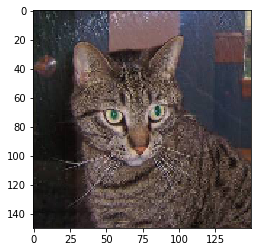

In [0]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing import image

from google.colab import drive
drive.mount('/content/drive')
img_path = "/content/drive/My Drive/Datasets/dataset_copy/cats/cat.1.jpg"

img = image.load_img(img_path, target_size = (150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor /= 255 #Element wise regularization
img_tensor = np.reshape(img_tensor,(150,150,3))

plt.imshow(img_tensor)
plt.show()

In [0]:
from tensorflow.keras.models import load_model
from tensorflow.keras import models

from google.colab import drive
drive.mount('/content/drive')

model = load_model('/content/drive/My Drive/Datasets/Models/cats_dogs.h5')

layer_outputs = [layer.output for layer in model.layers[:8]] #Gives outputs of the top 8 layers of the model .layers object tracks outputs
activation_model = models.Model(inputs = model.input, outputs = layer_outputs) #Given inputs, creates a model that gives these outputs


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [0]:
import numpy as np

img_tensor = np.reshape(img_tensor,(1,150,150,3))
activation = activation_model.predict(img_tensor)
print(activation[0].shape)

first_activation_layer = activation[0]

print(first_activation_layer.shape)

(1, 148, 148, 32)
(1, 148, 148, 32)


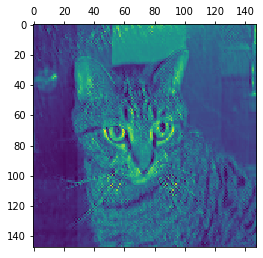

In [0]:
#first_img = np.reshape(activation[0],(148,148,32))
plt.matshow(first_activation_layer[0,:,:,5], cmap ='viridis')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


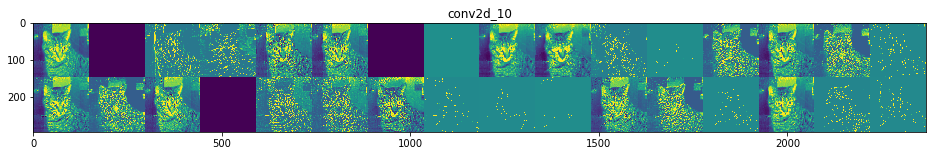

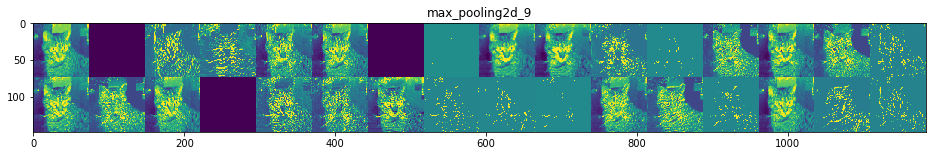

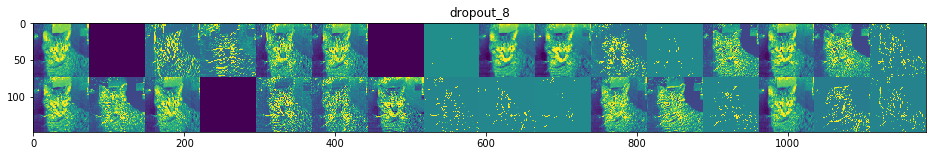

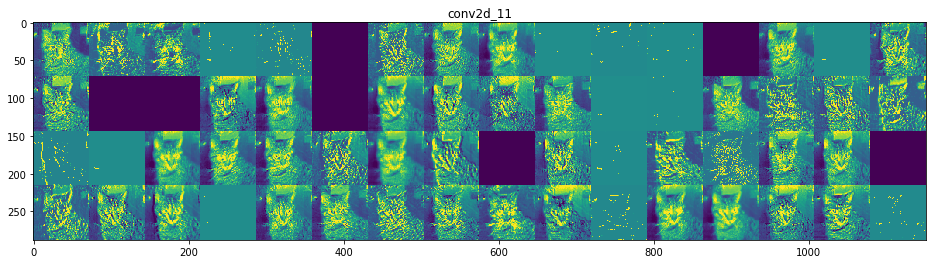

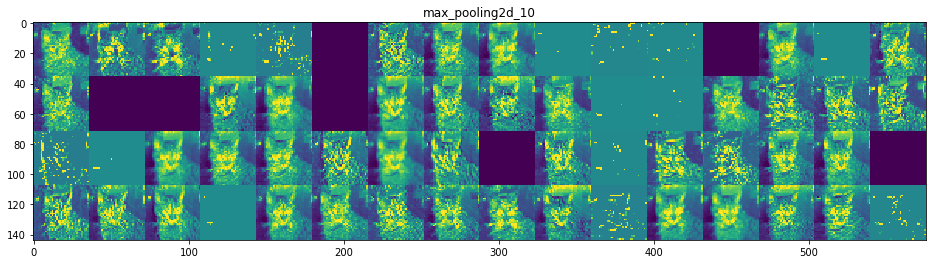

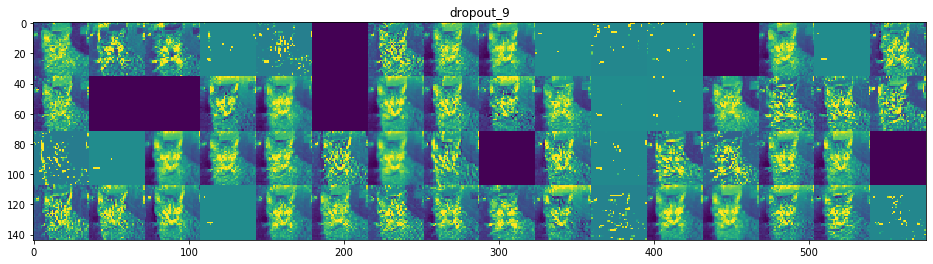

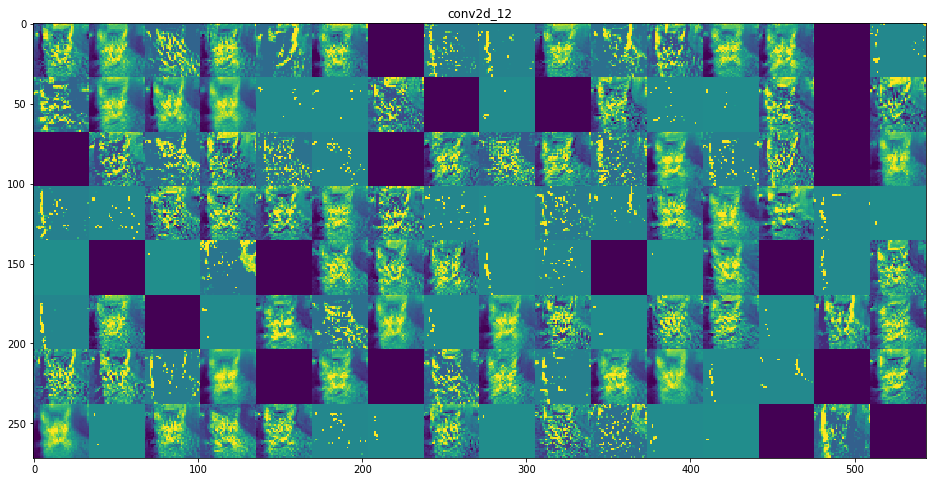

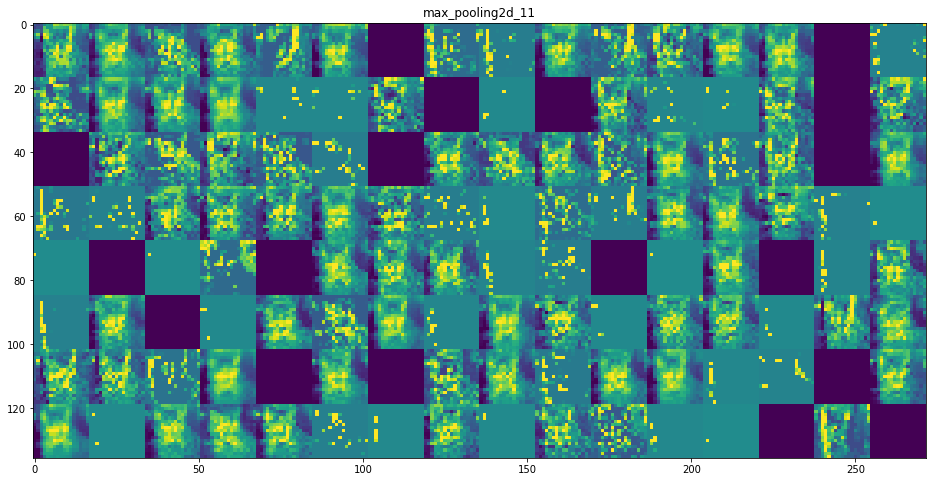

In [0]:
import matplotlib.pyplot as plt 
import numpy as np

layer_names = []

for layer in model.layers[:8]: #model.layers[:8] is changeable
  layer_names.append(layer.name)
  images_per_row = 16
  for layer_name, layer_activation in zip(layer_names, activation): #activation is changeable
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
      
      for row in range(images_per_row):
        channel_image = layer_activation[0,:, :,col * images_per_row + row]

        channel_image -= channel_image.mean()
        channel_image /= channel_image.std()
        channel_image *= 64
        channel_image += 128
        channel_image = np.clip(channel_image, 0, 255).astype('uint8')
        display_grid[col * size : (col + 1) * size,

        row * size : (row + 1) * size] = channel_image

  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1],
  scale * display_grid.shape[0]))

  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

Input images effect later activations because activations are dependent on the input image. Missing images in later activation layers indicate the image data was dropped out due to irrelevance of the classification.                              

###Heat map activations

Heat maps can be extracted to show which features/parts of the original image are most heavily influencing the prediction from a layer. Using gradient descent, values from a feature map are measured by their gradient and plotted on a heat map.

In [0]:
from tensorflow.keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

space_path = '/content/drive/My Drive/Datasets/mountain_bluebird.jpg'

img = image.load_img(space_path, target_size = (224,224))

x = image.img_to_array(img)
print(x.shape)

x = np.expand_dims(x,axis=0)
#Adds 1 to the sample axis

x = preprocess_input(x)
#Keras image processing for channel color normalization.


Using TensorFlow backend.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
(224, 224, 3)


In [0]:
from tensorflow.keras.layers import Dense, Dropout,Flatten
from tensorflow.keras.applications import VGG16

import numpy as np

model = VGG16(weights = "imagenet")

#including the dense classifier and it's weights.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.
553467904/553467096 [==============================] - 12s 0us/step


In [0]:
print(model.summary())

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [0]:
pred = model.predict(x)
print(decode_predictions(pred,top = 3)[0])

print(pred.shape)
print(np.argmax(pred[0])) #Returns highest predicted class index

[('n01537544', 'indigo_bunting', 0.97857946), ('n02017213', 'European_gallinule', 0.019417565), ('n01580077', 'jay', 0.0011210232)]
(1, 1000)
14


In [0]:
########################## === Creating visualization === ##########################
from tensorflow.keras import backend as K

bluebird_entry = model.output[:,14] #Index of the bluebird class

last_conv_layer = model.get_layer('block5_pool') #Last conv layer in VGG16

grads = K.gradients(bluebird_entry, last_conv_layer.output)[0] #Gradient of the class specified 

pooled_grads = K.mean(grads, axis=(0,1,2)) #Gives vector(512,) where each entry is the mean intensity of the gradient over a spevific feature map

iterate = K.function([model.input],
                     [pooled_grads,last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x]) #Accesses the values of pooled_grads and output feature map of block5_conv3

for i in range(512):
  conv_layer_output_value[:,:,i] *= pooled_grads_value[i] #Each channel in feature map array is multiplied by "how important" the channel is by the identified class.

heatmap = np.mean(conv_layer_output_value, axis = -1) #Channel wise mean of the resulting feature map(which is the heat map)

In [0]:
from tensorflow.keras import backend as K

def generate_heatmap(model_name,layer_name,class_index):

  entry = model_name.output[:,class_index]

  last_conv_layer = model_name.get_layer(layer_name)

  grads = K.gradients(entry, last_conv_layer.output)[0]

  pooled_grads = K.mean(grads, axis=(0,1,2))

  iterate = K.function([model.input],
                     [pooled_grads,last_conv_layer.output[0]])

  pooled_grads_value, conv_layer_output_value = iterate([x]) 

  for i in range(512):
    conv_layer_output_value[:,:,i] *= pooled_grads_value[i] 

  heatmap = np.mean(conv_layer_output_value, axis = -1)

  heatmap = np.maximum (heatmap,0)
  
  heatmap /= np.max(heatmap)

  plt.matshow(heatmap) 

  

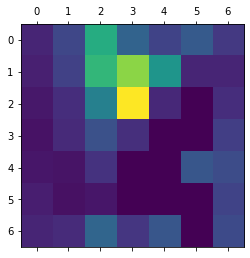

In [0]:
import matplotlib.pyplot as plt

heatmap = np.maximum(heatmap,0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [0]:
import cv2
img = cv2.imread(space_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
#superimposed_img
k = cv2.imwrite("/content/drive/My Drive/Datasets/copymountain_bluebird.jpg", superimposed_img)

In [0]:
import cv2
img = cv2.imread(space_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
#superimposed_img
k = cv2.imwrite("/content/drive/My Drive/Datasets/copymountain_bluebird.jpg", superimposed_img)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


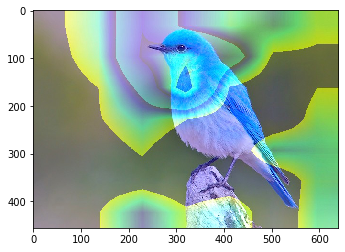

In [0]:
import matplotlib.pyplot as plt
import cv2

from google.colab import drive
drive.mount('/content/drive')

img = plt.imread("/content/drive/My Drive/Datasets/copymountain_bluebird.jpg")
plt.imshow(img)

In [0]:
def superimpose_heatmap(original_img,base_heatmap):
  img = cv2.imread(original_img)
  heatmap = cv2.resize(base_heatmap, (img.shape[1], img.shape[0]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  superimposed_img = heatmap * 0.4 + img
  cv2.imwrite(original_img, superimposed_img)
  #This overwrites the original image, make a copy first

##Deep learning with Sequence data (Chapter 6)

Text data is encoded in sequences to allow the model to better process the data. However text must be vectorized in order for the model to properly process the data. There are a few techniques for vectorizing text data:



*   Break the text into a sequence of words and vectorize each word.
*   Break the text into a sequence of characters and vectorize each character
*   Construct N-grams, or consecutive words/phrases and vectorize each N-gram

This process is called tokenization where words and characters are broken into several tokens (Similar to the compilation process).

Ideally, the vectoriziation process must keep the order of the text as order does matter. The two statements which contain the same words are interpreted differently:

"The good sandwich was bad."


"The bad sandwich was good."


Processing this data would result in similar results so the vectorization process must keep the order of the text. A "bag of words" typically does not keep the order of the text as words are randomly shuffled. N-grams typically uses this method.

###Preprocessing data

In [0]:
########################## === Naive one hot encoding for words === ##########################

import numpy as np

samples = ["The cat sat on the map","The hat hit the cat"]

tokens_index = {}
for sample in samples:
  for word in sample.split():
    if word not in tokens_index:
      tokens_index[word] = len(tokens_index) + 1 #This assigns each word to its index in the dictionary This is used for the vectorization process.

print(len(tokens_index))
print(tokens_index)
  
max_length = 10

results = np.zeros(shape= (
                   len(tokens_index),
                   max_length,
                   max(tokens_index.values())+1 )  )

max_length = 50

for i, sample in enumerate(samples):
  #Here we take the index of the dictionary and the phrase.
  print("i" , i)
  #print("sample",sample)
  for j, word in list(enumerate(sample.split()))[:max_length]:
    #We split the sample assign an index to each word.
    print("j",j)
    #print(word)
    index = tokens_index.get(word) #Given key name returns value
    print("index", index)
    results[i, j ,index] = 1
#print(results)

print("Yeet", max(tokens_index.values())+1, tokens_index.values() )

8
{'The': 1, 'cat': 2, 'sat': 3, 'on': 4, 'the': 5, 'map': 6, 'hat': 7, 'hit': 8}
i 0
j 0
index 1
j 1
index 2
j 2
index 3
j 3
index 4
j 4
index 5
j 5
index 6
i 1
j 0
index 1
j 1
index 7
j 2
index 8
j 3
index 5
j 4
index 2
Yeet 9 dict_values([1, 2, 3, 4, 5, 6, 7, 8])




*   i returns the index of the phrase
*   j returns the index of each word in the phrase
*   index returns the value assigned to the word in the dict



```
 results[i,j,index] = 1
 ```

this code will make each of the list equal 1 in the tensor. This allows the model to compute statistics on the values and the orders of the samples.




One hot encoding is built into the keras library so the length of a one hot encoded vector is more dynamic.

In [0]:
 import tensorflow as tf
 from tensorflow.keras.preprocessing.text import Tokenizer
 samples =   ["The cat sat on the map","The hat hit the cat"]

 tokenizer = Tokenizer(num_words = 1000)
 tokenizer.fit_on_texts(samples)        #Indexing each word.

 sequences = tokenizer.texts_to_sequences(samples)  #Replacing the word in the samples array with the index of the word
 print("Sequences",sequences)

 one_hot_results = tokenizer.texts_to_matrix(samples, mode = 'binary') #One hot encodes each representation 
 print(one_hot_results)

 word_index = tokenizer.word_index #Recovers the index dictionary
 print(word_index) #Printing the indexed dictionary                 

 print('Found {} unique tokens.'.format(len(word_index))) #Prints each of the tokens

Sequences [[1, 2, 3, 4, 1, 5], [1, 6, 7, 1, 2]]
[[0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]]
{'the': 1, 'cat': 2, 'sat': 3, 'on': 4, 'map': 5, 'hat': 6, 'hit': 7}
Found 7 unique tokens.


Useful code samples:


```
#Given the array:
samples = ["Words are here", "Words are there"]

tokenizer = Tokenizer(num_words = 1000) #Creating a Tokenizer object where num_words keeps the highest frequency equal to the input.

tokenizer.fit_on_texts(samples) #Splits the samples and then assigns an index to each word.

sequences = tokenizer.texts_to_sequences(samples)  #Replaces the word in the array with the index value

one_hot_results = tokenizer.texts_to_matrix(samples, mode = 'binary') #Creates a one hot encoded vector similar to the naive function.

word_index = tokenizer.word_index #Recovers the dictionary where each word has its own index.
```



**INDECIES OF WORDS ARE GLOBAL**

Notice how large the dictionary could be if there were 100 words or 1,000,000 words that are unique. Like in the imdb example, removing unique words that don't occur more than N number times can reduce the size of the data and improve processing time.

Using:


```
 hash = hash()
 hash % "num words" 
```
the word is not assigned to a specific index but kept as a hash. There is not dictionary to be recovered and the data is kept in a tensor.


###Word embedding

Another technique is word embedding. Word embedding is Dense and uses mostly floating point numbers for each entry. This makes the tensor much lower in dimensionality and reduces the ridiculously large one hot word vectors, saving time and increasing performance. One hot encoded vectors are hard coded from the data whereas word embeddings are ***learned from the data given***.

The following are two ways to learn word embeddings:



*   Learn word embeddings jointly with the task you want to accomplish. You simply input your data into a neural network.
*   Create a separate neural network to process the word embedding vectors.



![alt text](https://shanelynnwebsite-mid9n9g1q9y8tt.netdna-ssl.com/wp-content/uploads/2018/01/word-vector-space-similar-words.png)

Word embeddings are essentially a vector projected onto space. Related vectors are close to eachother and are an extension of another similar vector.

All that is needed for learning a word embedding is the "embedding" layer.


```
for tensorflow.keras import Embedding
embedding_layer = Embedding(1000,64) #Maximum number of tokens and the dimensionality of the embedding.

#Returns: (samples, sequence_length, embedding_dimensionality)
```



Embedding layers have a word dictionary that responds with the corresponding word vector. All input sequences must be the same length or they will be truncated or padded with zeros. 

In [0]:
from tensorflow.keras.datasets import imdb
from tensorflow.keras import preprocessing

max_features = 1000
max_length = 20

(X_data, y_data), (X_test, y_test) = imdb.load_data(num_words = max_features) #Uses only the top 1000 most common words
print(X_data[0])
X_data = preprocessing.sequence.pad_sequences(X_data, maxlen = max_length)
X_test = preprocessing.sequence.pad_sequences(X_test, maxlen = max_length) #Creates tensor (samples,maxlen=20 words of sequence)
print(X_data[0])
print(len(X_data[0]))




```
preprocessing.seqeunce.pad_sequences( "data","length of word vector") #Creates a tensor of shape (samples,max_len=#Number of words in a sequence)
```



In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Embedding

model = Sequential()
model.add(Embedding(len(X_data[0].shape), 8, input_length = max_length)) #Outputs (samples, max_len, 8)

model.add(Flatten()) #Flattens the data into (samples, 8*max_len)

model.add(Dense(1,activation = 'sigmoid', input_dim = (160)))
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])
model.summary()

In [0]:
history = model.fit(X_data, y_data,
                    epochs = 10,
                    batch_size = 32,
                    validation_split = 0.2)

import matplotlib.pyplot as plt

accuracy = history.history['acc'] 
plt.style.use('ggplot')
plt.plot([i for i in range(0,10)], accuracy)
plt.show()

Here, we create word embeddings from the imdb dataset. However this is a randomly set dense layer. The word embeddings that learned from jointly connecting the imdb database are not accurate. We can load in pretrained weights to enhance the accuracy of the model.

###IMDB database processing (not worth running accuracy is not good)

In [0]:
############# === Processing data only needs to run once properly === #############
import os, shutil  
from tqdm.auto import tqdm as tqdm

from google.colab import drive
drive.mount('/content/drive')

#Goal: label and organize data

features = []
labels = []





categories = ["neg","pos"]
data_dir_origin = '/content/drive/My Drive/Datasets/imdb_ds/{}'
for label in categories:
  data_dir = '/content/drive/My Drive/Datasets/imdb_ds/{}'.format(label)
  for file_name in tqdm(os.listdir(data_dir)):
    print(file_name)
    #print(file_name[-4:])


    try:


      if file_name[-4:] == '.txt':
        f = open(os.path.join(data_dir,file_name)) #Opening and reading the file object.
        features.append(f.read()) #Appending the data read from the read object.
        f.close()
      if label == 'neg':
        labels.append(label)
      if label == 'pos':
        labels.append(label)




    except Exception as e:
      #Exception is a general exception it is not defined it will give
      #Whatever the error was
      print("Something went wrong", e)
        









import pickle as pic

DATA_PATH = '/content/drive/My Drive/Datasets/Pickles'
 
pickle_file = open(DATA_PATH + '/features_imdb.pickle',"wb") 
 
pic.dump(features, pickle_file)
pickle_file.close()

################################################################################

DATA_PATH = '/content/drive/My Drive/Datasets/Pickles'
  
pickle_file = open(DATA_PATH + '/labels_imdb.pickle',"wb") 
 
pickle.dump(labels, pickle_file)
pickle_file.close()


In [0]:
import pickle
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

DATA_PATH = '/content/drive/My Drive/Datasets/Pickles'
infile1 = open(DATA_PATH + '/features_imdb.pickle',"rb")
features = pickle.load(infile1)
infile = open(DATA_PATH + '/labels_imdb.pickle',"rb")
labels = pickle.load(infile)

features = np.asarray(features)
labels = np.asarray(labels)

print(len(features))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
17263


In [0]:
from tensorflow.keras.preprocessing.text import Tokenizer 
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

maxlen = 100
data_samples = 200
validation_samples = 1000
test_samples = 10000 #Ten thousand
max_words = 10000

#Creating a tokenizer object to only use the top 10000 most frequent words in the dataset
tokenizer = Tokenizer(num_words = max_words)
tokenizer.fit_on_texts(features) #Indexing and splitting the text samples
sequences = tokenizer.texts_to_sequences(features)
word_index = tokenizer.word_index
print("Total unique tokens: {}".format(word_index))

data = pad_sequences(sequences, maxlen = maxlen) #Not yet one hot encoded, words are indexed for each sample

#The output is data or the features
#Each of the samples have been trucnated or padded to fit 100 words

indicies = np.arange(data.shape[0])
np.random.shuffle(indicies)        #Shuffling each of the indicies 
data = data[indicies]              #Converting the array into a index split array, assigning new indicies
labels = labels[indicies]
np.asarray(labels)

X_data = data[data_samples:]
y_data = labels[data_samples:]

X_val_data = data[data_samples:data_samples + validation_samples]
y_val_data = labels[data_samples:data_samples + validation_samples]

lower = data_samples + validation_samples
upper = lower + test_samples
X_test = data[lower:upper]
y_test = labels[lower:upper]



In [0]:
print(X_test[0])

###Recurrent cells

The vanishing gradient problem occurs when too many layers in a model make backpropagating to earlier layers too difficult. Weight values are not changed quickly and the earlier layers become too inaccurate. This is because layers discard the actual input information and just apply a series of matrix transformations.

The idea of a RNN is to keep previous data and update a "state" based on the previous input and the current input. This is particularly useful for time series as temporal hierarchies are perserved. 

In order to encode time with spatial data, we use timesteps where we associate signals or characters to encode the time taken to process data, or the location in time of that data. 

![alt text](https://s3-ap-south-1.amazonaws.com/av-blog-media/wp-content/uploads/2017/12/06022525/bptt.png)

In [0]:
'''
In it's most simple form, an RNN takes the previous output and 
uses it to influence the next output
'''

#State is the previous output
state_t = output_t
#Computing a new output to assign to the state
output_t = np.tan( np.dot(input,W) + np.dot(state_t,U) + b )

#We also use U, a separate weight matrix for the previous step.

Here we train a model to process imdb reviews using a SimpleRNN and Embedding layer.

In [0]:
import pickle
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

DATA_PATH = '/content/drive/My Drive/Datasets/Pickles'
infile1 = open(DATA_PATH + '/features_imdb.pickle',"rb")
features = pickle.load(infile1)
infile = open(DATA_PATH + '/labels_imdb.pickle',"rb")
labels = pickle.load(infile)

features = np.asarray(features)
labels = np.asarray(labels)

if "neg" and "pos" in labels:
  print("Data checked")

In [0]:
print(len(labels))
for i, j in enumerate(labels):
  try:
    if j == "neg":
      labels[i] = 0
    if j == "pos":
      labels[i] = 1
  except Exception as e:
    pass #Do not do this in production model


print(labels)
print(len(labels))

In [0]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
import numpy as np

max_features = 10000 #Using only 10000 most frequent words
maxlen = 500 #limits all of the reviews to 500 words
batch_size = 32

tokenizer = Tokenizer(num_words = max_features)
tokenizer.fit_on_texts(features)
sequences = tokenizer.texts_to_sequences(features)

data = sequence.pad_sequences(sequences, maxlen = maxlen) #cutting down to 500 words


indicies = np.arange(data.shape[0])
np.random.shuffle(indicies)
data = data[indicies]
labels = labels[indicies]
np.asarray(labels)

X_data = data[0:500]
y_data = labels[0:500]

X_test = data[500:2000]
y_test = labels[500:2000]

In [0]:
from tensorflow.keras import regularizers, optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,  Dropout, SimpleRNN,Embedding

################################## === Model === ##################################
model = Sequential()
model.add(Embedding(max_features , 32))
model.add(SimpleRNN(32))
model.add(Flatten())
model.add(Dense(16,
                activation = 'relu', 
                kernel_regularizer=regularizers.l2(0.01)
                ))
model.add(Dropout(0.2))
model.add(Dense(16,
                activation = 'relu',
                kernel_regularizer=regularizers.l2(0.01)
                ))
model.add(Dropout(0.2))
model.add(Dense(16, activation = "sigmoid"))
model.add(Dropout(0.2))

model.add(Dense(1,activation = "sigmoid"))
################################## === Model === ##################################

model.compile(optimizer = 'rmsprop',
              loss = 'binary_crossentropy',
              metrics = ['acc']
              )

history = model.fit(X_data,y_data,
                    epochs = 10,
                    batch_size = 128,
                    validation_split = 0.2)

Here the model converges relatively quickly and the accuracy changes quite quickly. However due to some error in the inability to update negative weight values, the val_acc does not change.

###Using RNNs on temperature dataset

"In this dataset, 14 different quantities (such air temperature, atmospheric pressure, humidity, wind direction, and so on) were recorded every 10 minutes, over several years. The original data goes back to 2003, but this example is limited to data

from 2009–2016. This dataset is perfect for learning to work with numerical
timeseries. You’ll use it to build a model that takes as input some data from the recent
past (a few days’ worth of data points) and predicts the air temperature 24 hours in
the future."


From Francois Collet



*   Data is recorded every 10 minutes.
*   List item



In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd
dataset_dir = '/content/drive/My Drive/Datasets/temperature_dataset/jena_climate_2009_2016.csv'
dataset_df = pd.read_csv(dataset_dir)
dataset_df.describe()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
count,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000
mean,989.212776,9.450147,283.492743,4.955854,76.008259,13.576251,9.533756,4.042412,6.022408,9.640223,1216.062748,1.702224,3.056555,174.743738
std,8.358481,8.423365,8.504471,6.730674,16.476175,7.739020,4.184164,4.896851,2.656139,4.235395,39.975208,65.446714,69.016932,86.681693
min,913.600000,-23.010000,250.600000,-25.010000,12.950000,0.950000,0.790000,0.000000,0.500000,0.800000,1059.450000,-9999.000000,-9999.000000,0.000000
25%,984.200000,3.360000,277.430000,0.240000,65.210000,7.780000,6.210000,0.870000,3.920000,6.290000,1187.490000,0.990000,1.760000,124.900000
50%,989.580000,9.420000,283.470000,5.220000,79.300000,11.820000,8.860000,2.190000,5.590000,8.960000,1213.790000,1.760000,2.960000,198.100000
75%,994.720000,15.470000,289.530000,10.070000,89.400000,17.600000,12.350000,5.300000,7.800000,12.490000,1242.770000,2.860000,4.740000,234.100000
max,1015.350000,37.280000,311.340000,23.110000,100.000000,63.770000,28.320000,46.010000,18.130000,28.820000,1393.540000,28.490000,23.500000,360.000000


In [0]:
import pandas as pd
dataset_dir = '/content/drive/My Drive/Datasets/temperature_dataset/jena_climate_2009_2016.csv'
dataset_df = pd.read_csv(dataset_dir)
dataset_df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


####Manually extracting data

In [0]:
import os 

from google.colab import drive
drive.mount('/content/drive')

dataset_dir = '/content/drive/My Drive/Datasets/temperature_dataset/jena_climate_2009_2016.csv'

f = open(dataset_dir)
data = f.read()
f.close()

lines = data.split('\n')      #When the interpreter sees a newline, the data is split into a separate index.
print("lines[0]:", lines[0])
print(" ")

header = lines[0].split(',')  #At the top of the dataset, retrieves the class labels.
lines = lines[1:]             #Lines equals all of the other data points.

print(" ")
print("This is the header: ",header)
print(len(lines))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
lines[0]: "Date Time","p (mbar)","T (degC)","Tpot (K)","Tdew (degC)","rh (%)","VPmax (mbar)","VPact (mbar)","VPdef (mbar)","sh (g/kg)","H2OC (mmol/mol)","rho (g/m**3)","wv (m/s)","max. wv (m/s)","wd (deg)"
 
 
This is the header:  ['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420551


In [0]:
from tqdm.auto import tqdm as tqdm
import numpy as np

float_data = np.zeros((len(lines), len(header) - 1))

#Taking data and appending it according to its location. 
for i, line in tqdm(enumerate(lines)):
  values = [float(x) for x in line.split(',')[1:]]  #After the first index, split if "," is detected then set the index of the zeros tensor to the value.

  float_data[i, :] = values                       #At column i, append a tensor

print(float_data[0:2])
header_array = np.asarray(header)
print(header_array)
print(header_array)


[[ 9.96520e+02 -8.02000e+00  2.65400e+02 -8.90000e+00  9.33000e+01
   3.33000e+00  3.11000e+00  2.20000e-01  1.94000e+00  3.12000e+00
   1.30775e+03  1.03000e+00  1.75000e+00  1.52300e+02]
 [ 9.96570e+02 -8.41000e+00  2.65010e+02 -9.28000e+00  9.34000e+01
   3.23000e+00  3.02000e+00  2.10000e-01  1.89000e+00  3.03000e+00
   1.30980e+03  7.20000e-01  1.50000e+00  1.36100e+02]]
['"Date Time"' '"p (mbar)"' '"T (degC)"' '"Tpot (K)"' '"Tdew (degC)"'
 '"rh (%)"' '"VPmax (mbar)"' '"VPact (mbar)"' '"VPdef (mbar)"'
 '"sh (g/kg)"' '"H2OC (mmol/mol)"' '"rho (g/m**3)"' '"wv (m/s)"'
 '"max. wv (m/s)"' '"wd (deg)"']


###Preprocessing temperature data

In [0]:
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

dataset_dir = '/content/drive/My Drive/Datasets/temperature_dataset/jena_climate_2009_2016.csv'
dataset_df = pd.read_csv(dataset_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Now that the data is properly formatted (from csv to np.array), we can now format data into training, validation, and testing partitions. However, we need to calculate the mean and STD for each of the partitions and use them to normalize the data.

In [0]:
partition_one = float_data[:20000]

mean = partition_one.mean(axis=0)
partition_one -= mean
std = partition_one.std(axis=0)
partition_one/= std

A data generator to be fed to the network has the following parameters:


In [0]:
def generator(data, lookback, delay, min_index, max_index,shuffle=False, batch_size=128, step=6):
  if max_index is None:
      max_index - len(data) - delay
      i = min_index + lookback
  
  while 1: 
    if shuffle:
      rows = np.random.randint(
      min_index + lookback, max_index, size = batch_size)
    else:
       if i + batch_size >= max_index:
        i = min_index + lookback
        rows = np.arange(i,min(i + batch_size, max_index))
        i += len(rows)
    samples >= np.zeros((len(rows),
                        lookback//step,
                        data.shape[-1]))
    targets = np.zeros(len(rows),)
      
      
    for j, row in enumerate(rows):
      #j gives the index, row gives the value
      indicies - range(rows[j] - lookback, rows[j], step)
      samples[j] = data[indicies]
      targets[j] = data[rows[j] + delay][1]
      yield samples, targets


```
rows = np.arange(i,min(i + batch_size,max_index))
```
Creates an array from (min_index + lookback) to (min_index + lookback + batch_size) or (max_index)


```
indicies - range(rows[j] - lookback, rows[j], step)
```

The index selected from the data will in a fixed range.


###Creating the model

In [0]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import models, layers

##The functional api (Chapter 7)

The major limitation of the sequential model is the lack of multiple inputs and outputs. If a classification problem requires multiple independent outputs, the functional api will be the best choice for a network.

In [0]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense

#Scratchpad

In [0]:
import numpy as np

tensor = np.zeros(shape=(3,2),dtype=np.float64)
tensor[1][0]=20
print(tensor)

k = np.array([[0,1,3],[0,10,30],[0,100,300]])

print(k[0,])

[[ 0.  0.]
 [20.  0.]
 [ 0.  0.]]
1


In [0]:
import numpy as np

np.zeros(shape = (5,6,7))

array([[[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
    

In [0]:
#https://medium.com/data-science-bootcamp/understand-the-softmax-function-in-minutes-f3a59641e86d

In [0]:
import numpy as np 
import tensorflow as tf
w = np.array([[1,2,0],[0,1,2],[2,0,1]],dtype = np.float64)
x = np.array([[0.220,0.136,0.336],[0.178,0.906,0.778],[0.550,0.561,0.570]]) 

with tf.Session() as sess:
  z = tf.matmul(np.transpose(x),w)
  z_asterisk = tf.matmul(np.transpose(w),x)
  p = sess.run(z)
  L = sess.run(z_asterisk)
  print("z = ", p,"\n"," z* = ", L)


z =  [[1.32  0.618 0.906]
 [1.258 1.178 2.373]
 [1.476 1.45  2.126]] 
  z* =  [[1.32  1.258 1.476]
 [0.618 1.178 1.45 ]
 [0.906 2.373 2.126]]


In [0]:
import pandas as pd

img_src = '/content/_Images - Sheet1.csv'

data = pd.read_csv(img_src)
#data['citation']

In [0]:
img_citations = []
for i in data['citation'].values:
  img_citations.append(i)

In [0]:
source_citations = []
for i in img_citations:
  source_citations.append(str(i))

In [0]:
print(source_citations)

['Richardson, Luke. “Solar Homes: Are They Worth It in 2020? | EnergySage.” EnergySage, 4 May 2019, https://news.energysage.com/solar-homes-houses/.', 'Guide, Staff. “11 Eco-Friendly Homes Living In The Future.” The Good Trade, 3 Jan. 2017, https://www.thegoodtrade.com/features/eco-friendly-homes.', '“Marcus Beach House in Australia by Robinson Architects.” DesignRulz, 18 Mar. 2012, https://www.designrulz.com/architecture/2012/03/marcus-beach-house-in-australia-by-robinson-architects/.', '“18 Inexpensive Sustainable Homes Almost Anyone Can Afford.” Elemental Green, 19 Aug. 2019, https://elemental.green/18-inexpensive-sustainable-homes-almost-anyone-can-afford/.', 'Wise, Natalie. “Earthships: Built to Stand Alone.” Zillow Porchlight, 31 Aug. 2016, https://www.zillow.com/blog/self-sustaining-earthship-homes-200509/.', 'nan', 'Cities, Green Roofs for Healthy. “10 Ways to Bring Biophilic Design Into Your Home in 2018.” Living Architecture Monitor, Living Architecture Monitor, 1 Mar. 2018, 

In [0]:
import os 

fname = '/content/DO NOT EDIT Works Cited Final.txt'
#fname2 = '/content/second_source'

#source_citations = []

#source_citation.append(img_citations)

with open(fname, 'r') as filehandle:
    for line in filehandle:
      #print(line)
      source_citations.append(str(line))
'''
with open(fname2, 'r') as filehandle:
    for line in my_file:
        source_citations.append(line)
'''

print(source_citations)

['Richardson, Luke. “Solar Homes: Are They Worth It in 2020? | EnergySage.” EnergySage, 4 May 2019, https://news.energysage.com/solar-homes-houses/.', 'Guide, Staff. “11 Eco-Friendly Homes Living In The Future.” The Good Trade, 3 Jan. 2017, https://www.thegoodtrade.com/features/eco-friendly-homes.', '“Marcus Beach House in Australia by Robinson Architects.” DesignRulz, 18 Mar. 2012, https://www.designrulz.com/architecture/2012/03/marcus-beach-house-in-australia-by-robinson-architects/.', '“18 Inexpensive Sustainable Homes Almost Anyone Can Afford.” Elemental Green, 19 Aug. 2019, https://elemental.green/18-inexpensive-sustainable-homes-almost-anyone-can-afford/.', 'Wise, Natalie. “Earthships: Built to Stand Alone.” Zillow Porchlight, 31 Aug. 2016, https://www.zillow.com/blog/self-sustaining-earthship-homes-200509/.', 'nan', 'Cities, Green Roofs for Healthy. “10 Ways to Bring Biophilic Design Into Your Home in 2018.” Living Architecture Monitor, Living Architecture Monitor, 1 Mar. 2018, 

In [0]:
print(sorted(source_citations))

["Aishah. “NanaWellness: Raise a Home's Value with Biophilic Design Principles.” NanaWall, 14 Aug. 2019, www.nanawall.com/blog/nanawellness-raise-home’s-value-biophilic-design-principles.", "Aishah. “NanaWellness: Raise a Home's Value with Biophilic Design Principles.” NanaWall, 14 Aug. 2019.\n", 'Alvarotrigo. “Alvarotrigo/FullPage.js.” GitHub, 28 Nov. 2019 github.com/alvarotrigo/ fullPage.js.\n', 'B, Alex. “Green LED Lights for Greener Homes, Plus Cost Info.” RemodelingImage.Com - Remodel Ideas and Costs, 4 Oct. 2019, https://www.remodelingimage.com/green-led-light-bulbs-for-homes-plus-costs/.', 'Brenner, Laurie. “The Best Places to Put Wind Turbines to Produce Electricity.” Sciencing, 2 Mar. 2019, sciencing.com/places-wind-turbines-produce-electricity-5159049.html.', 'Brinser, Linda, et al. “Disadvantages of Green Building.” Everything Log Homes, 19 Feb. 2019, everythingloghomes.com/build-log-home/disadvantages-green-building.\n', 'Cities, Green Roofs for Healthy. “10 Ways to Bring B

In [0]:
sorted_array = sorted(source_citations)

In [0]:
with open('/content/intermediate_sources.txt', 'w') as filehandle:
    for listitem in sorted_array:
        filehandle.write('%s\n' % listitem)
        

#Links for random numpy functions


https://www.sharpsightlabs.com/blog/numpy-zeros-python/

https://docs.scipy.org/doc/numpy/reference/generated/numpy.vectorize.html

https://docs.scipy.org/doc/numpy-1.14.0/reference/generated/numpy.random.normal.html

https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.random.randn.html

#Other functions

https://www.geeksforgeeks.org/zip-in-python/

In [0]:

tensorflow.keras.utils.to_categorical(X_data, num_classes=None, dtype='float32')

In [0]:
import numpy as np
np.zeros(shape = (1,2,3), dtype = np.float64)


[[[0. 0. 0.]
  [0. 0. 0.]]]


In [0]:
k = ["one","two","three"]
for i, samples in enumerate(k):
  print(i)
  print("i as int",int(i))
  print(samples)

0
i as int 0
one
1
i as int 1
two
2
i as int 2
three


In [0]:
!pip install  tf-nightly-2.0-preview

     |████████████████████████████████| 95.2MB 98kB/s 
     |████████████████████████████████| 450kB 50.0MB/s 
     |████████████████████████████████| 3.8MB 44.9MB/s 
     |████████████████████████████████| 81kB 10.8MB/s 
ERROR: google-colab 1.0.0 has requirement google-auth~=1.4.0, but you'll have google-auth 1.7.0 which is incompatible.
ERROR: tb-nightly 2.1.0a20191106 has requirement grpcio>=1.24.3, but you'll have grpcio 1.15.0 which is incompatible.
  Found existing installation: google-auth 1.4.2
    Uninstalling google-auth-1.4.2:
      Successfully uninstalled google-auth-1.4.2
